In [5]:
# load libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.cluster as skl_cls
%matplotlib inline

In [6]:
# id нужных регионов
regsDf = pd.read_csv('../crowdRegs.csv',names=['id','regId']);

# подгружаем сохранённые ранее данные для этих регионов
df = pd.read_pickle('../crowdRegs2.pcl')
df.columns = regsDf.regId.values.astype('str')

In [7]:
# стандартизируем ряды - вычитаем среднее, делим на среднеквадратичное отклонение
df2 = df.apply(lambda x: (x - x.mean()), raw = True)
df2 = df2.apply(lambda x: x /(x.std()), raw = True)

(-2, 5)

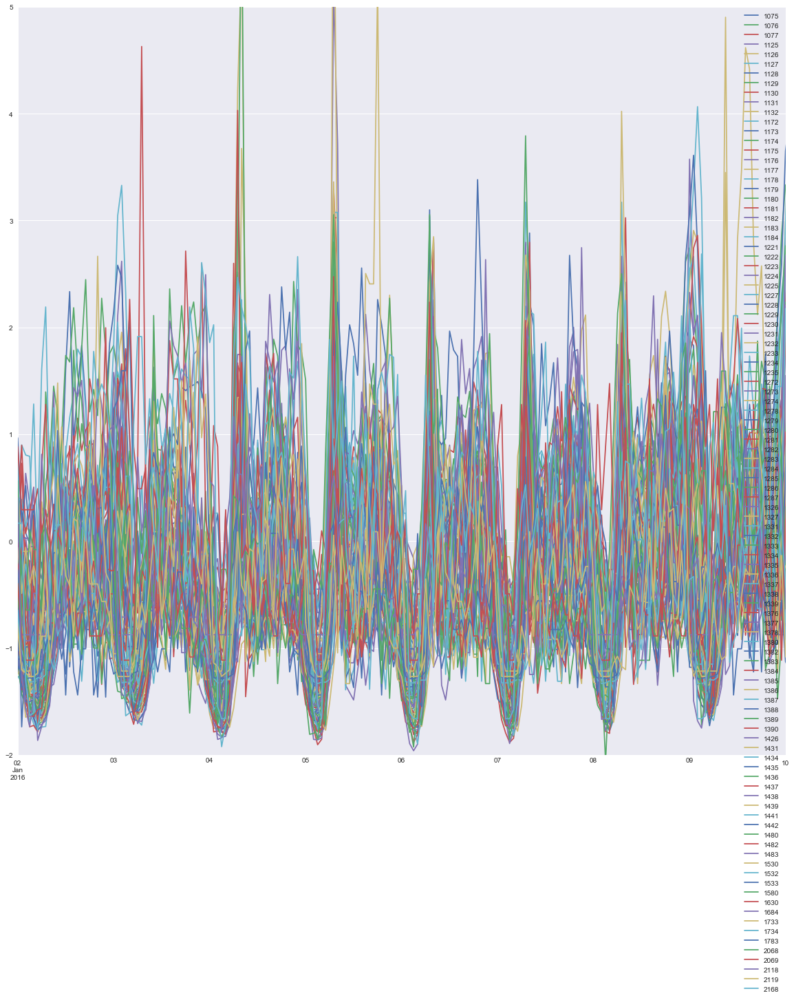

In [8]:
# смотрим что из этого получается
df2.loc['2016-01-02':'2016-01-10',:].plot(figsize = [20,20])
plt.xlim(['2016-01-02','2016-01-10'])
plt.ylim([-2, 5])

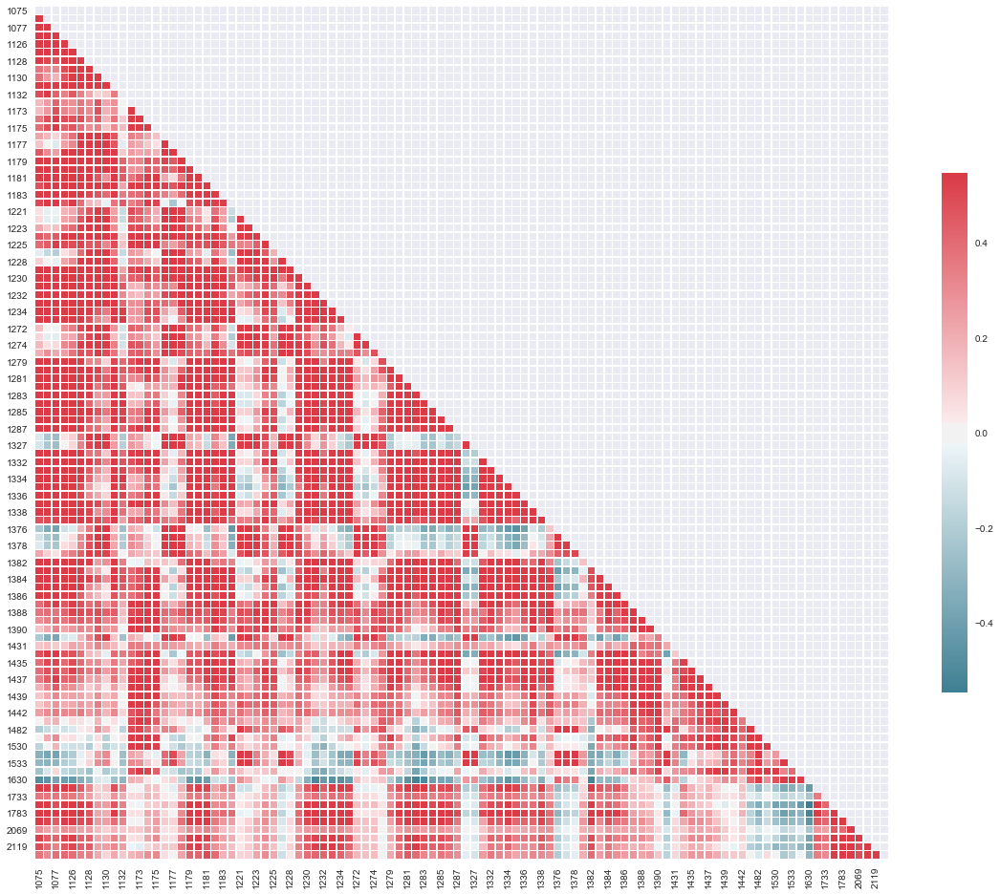

In [9]:
# Вычислим корреляцию рядов для некоторого диапазона дат (1 января 2016 - 31 марта 2016)
s2 = df2.loc['2016-01-01':'2016-03-31',:]
corr = s2.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 20))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, square=True, xticklabels=2, yticklabels=2,
            linewidths=.5, cbar_kws={"shrink": .5}, ax=ax)

Далее я пытался кластеризовать ряды на основе взаимной корреляции

In [10]:
# первый кластер - регионы 1280-1286
s2.loc[:,'1280':'1286'].corr()

,1280,1281,1282,1283,1284,1285,1286
1280,1.000000,0.842870,0.683403,0.805766,0.745812,0.901478,0.881757
1281,0.842870,1.000000,0.908614,0.827844,0.664085,0.810073,0.763455
1282,0.683403,0.908614,1.000000,0.860063,0.681004,0.735031,0.682202
1283,0.805766,0.827844,0.860063,1.000000,0.873988,0.867560,0.864549
1284,0.745812,0.664085,0.681004,0.873988,1.000000,0.867695,0.856750
1285,0.901478,0.810073,0.735031,0.867560,0.867695,1.000000,0.953940
1286,0.881757,0.763455,0.682202,0.864549,0.856750,0.953940,1.000000


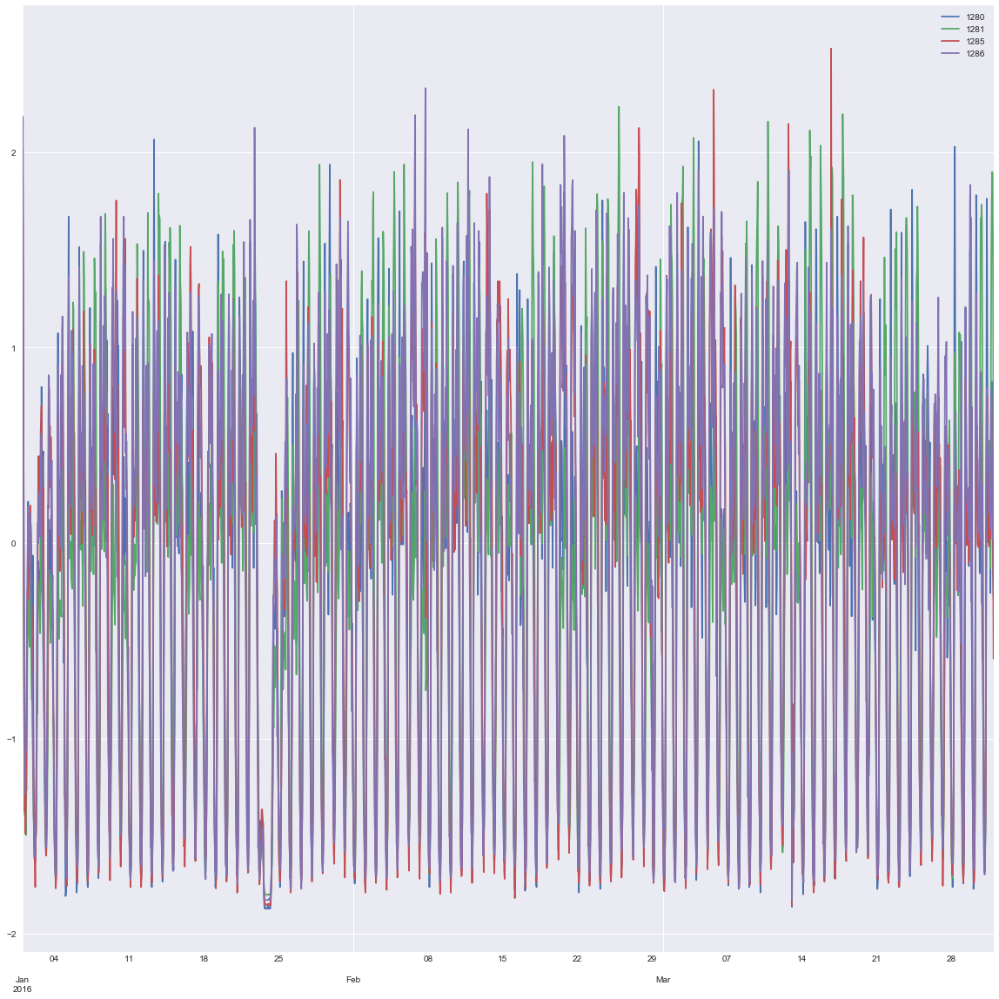

In [11]:
s2.loc[:,['1280','1281','1285','1286']].plot(figsize=[20,20])

In [12]:
n_clusters = 10;
kMean = skl_cls.KMeans(n_clusters, random_state=0,max_iter = 1000, n_jobs = 4)

kMean.fit(s2)
labels = kMean.labels_

colId = {x: list() for x in range(0,n_clusters)}

for label, col in zip(kMean.labels_,s2.columns):
    colId.get(label).append(col) 

0 ['1127', '1128', '1129', '1131', '1132', '1172', '1173', '1230', '1231', '1232', '1334', '1335', '1336', '1435']
1 ['1130', '1222', '1223', '1224', '1225', '1227', '1228', '1229', '1326', '1327', '1331', '1332', '1333', '1388', '1389', '1390', '1426', '1431', '1434', '1783', '2068', '2069', '2118', '2119', '2168']
2 ['1533']
3 ['1286', '1287']
4 ['1076', '1077', '1125', '1126']
5 ['1180', '1181', '1182', '1183', '1184', '1221', '1281', '1282', '1283', '1284', '1285', '1383', '1384', '1385', '1386', '1387', '1684', '1733', '1734']
6 ['1175', '1176', '1177', '1178', '1179', '1233', '1234', '1235', '1272', '1273', '1274', '1278', '1279', '1280', '1338', '1339', '1376', '1377', '1378', '1380', '1382', '1439', '1441', '1442', '1480', '1482', '1483', '1530', '1532', '1630']
7 ['1075', '1436', '1437']
8 ['1580']
9 ['1174', '1337', '1438']


D:\Anaconda2\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


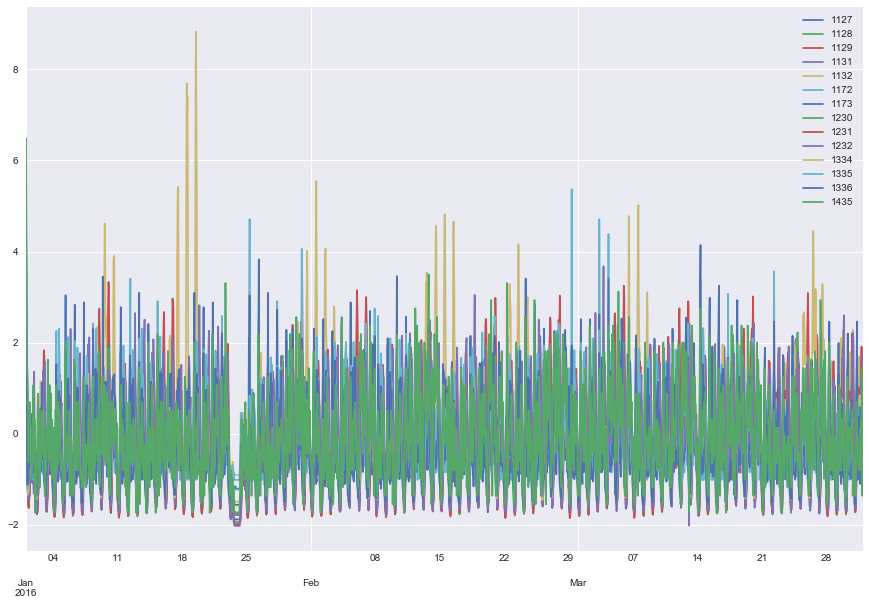

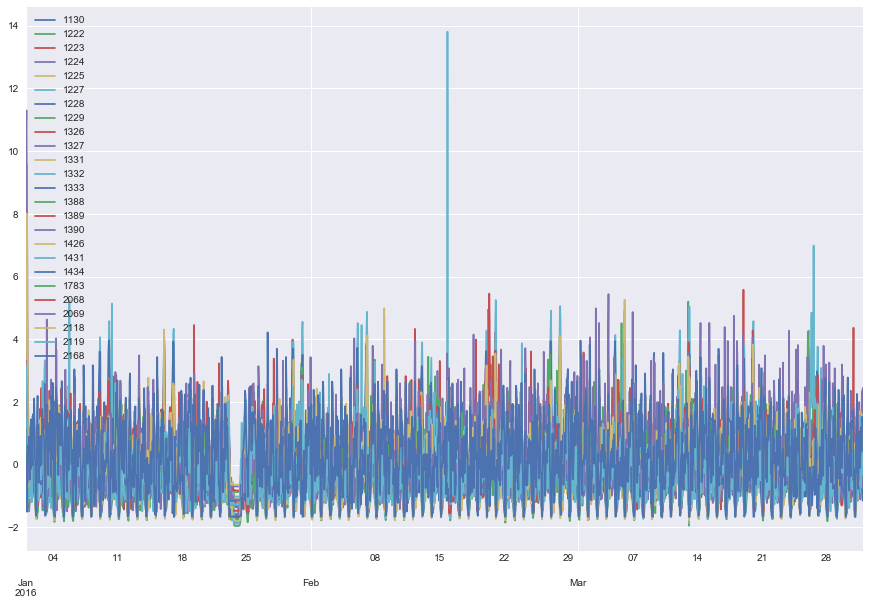

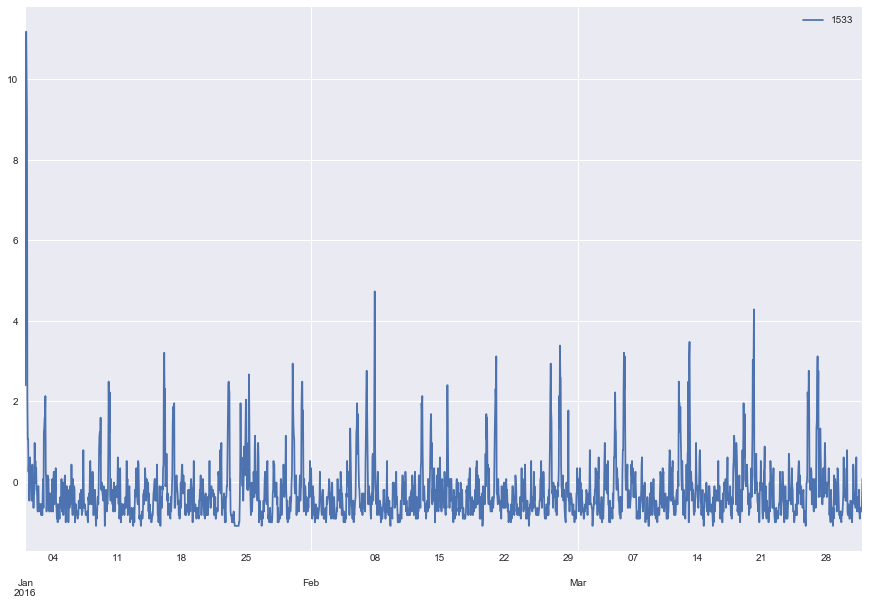

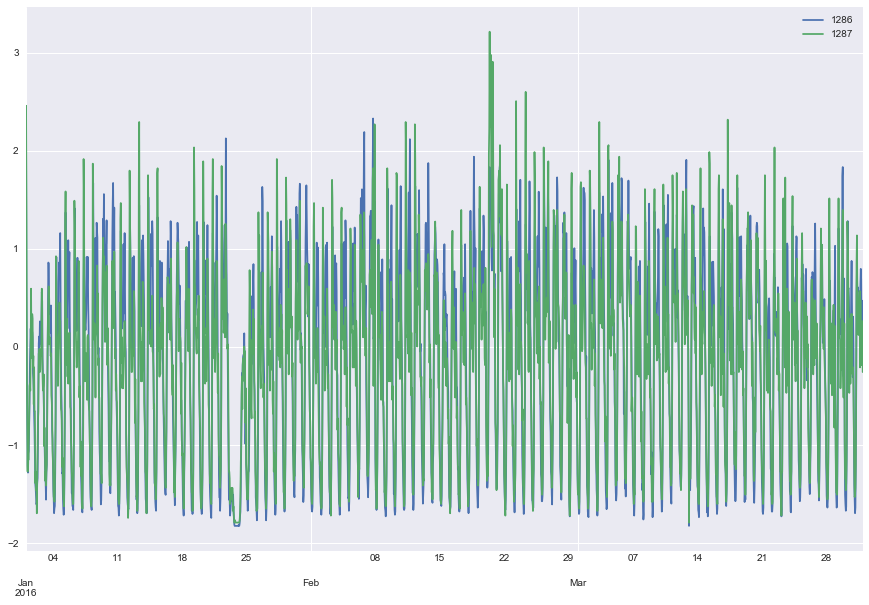

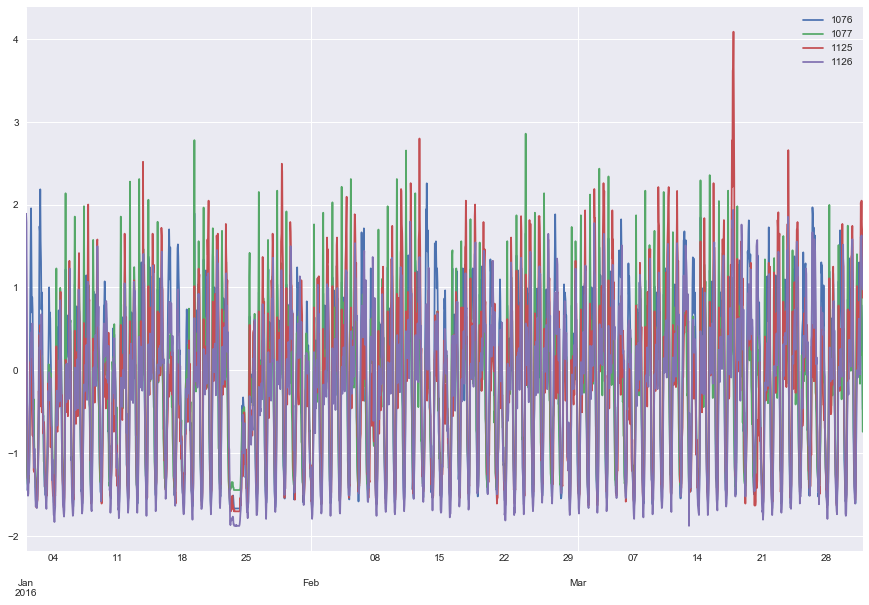

...

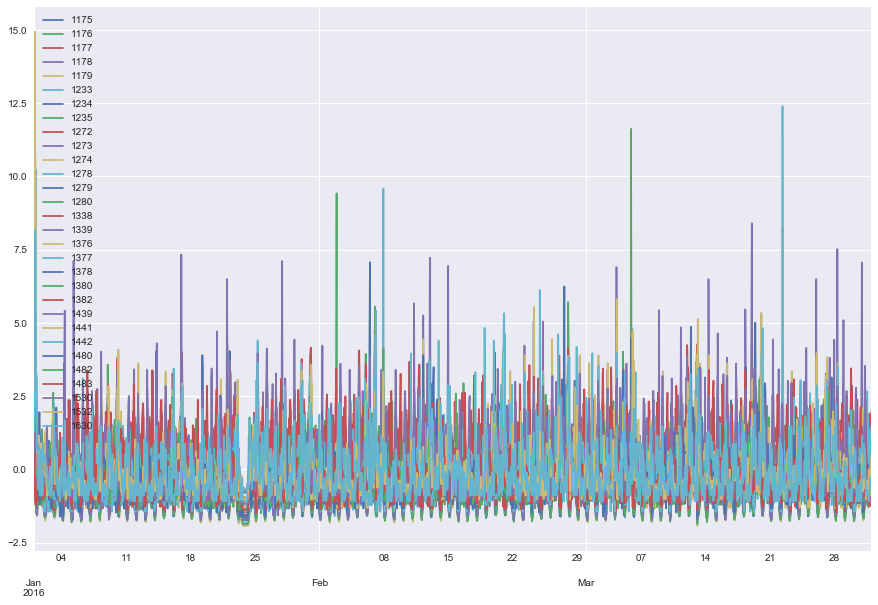

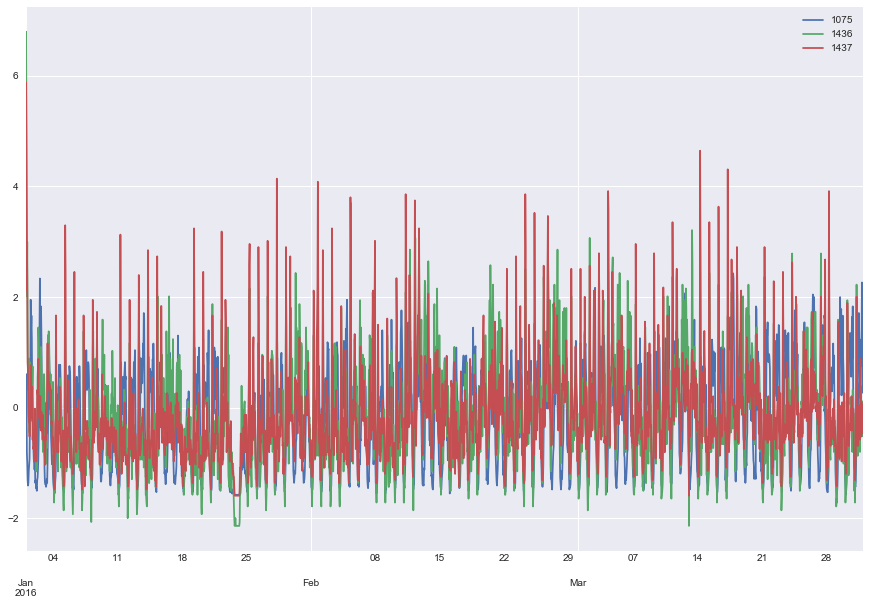

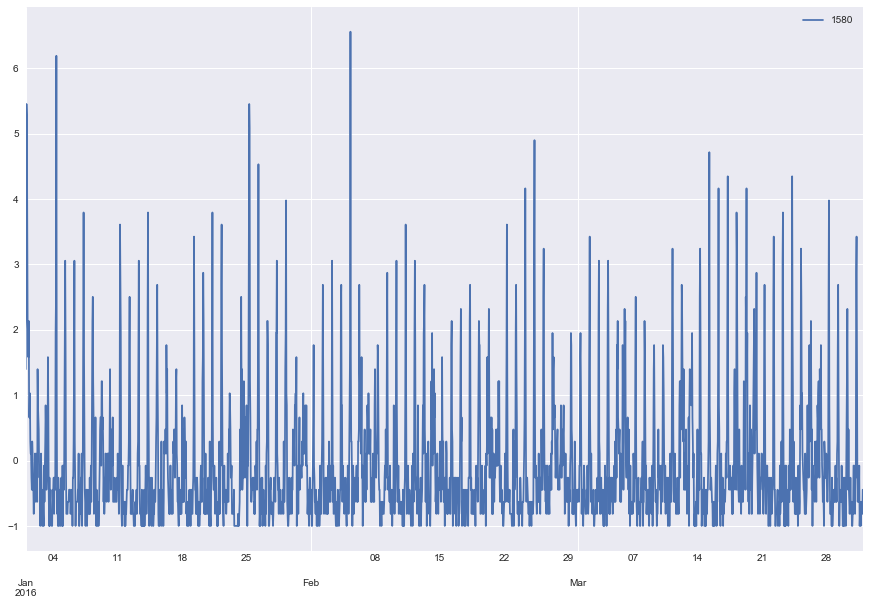

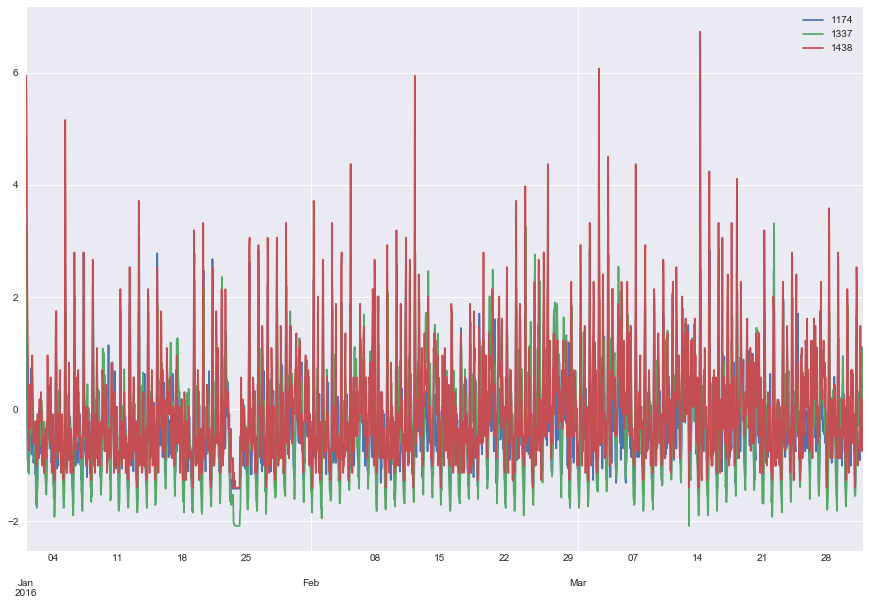

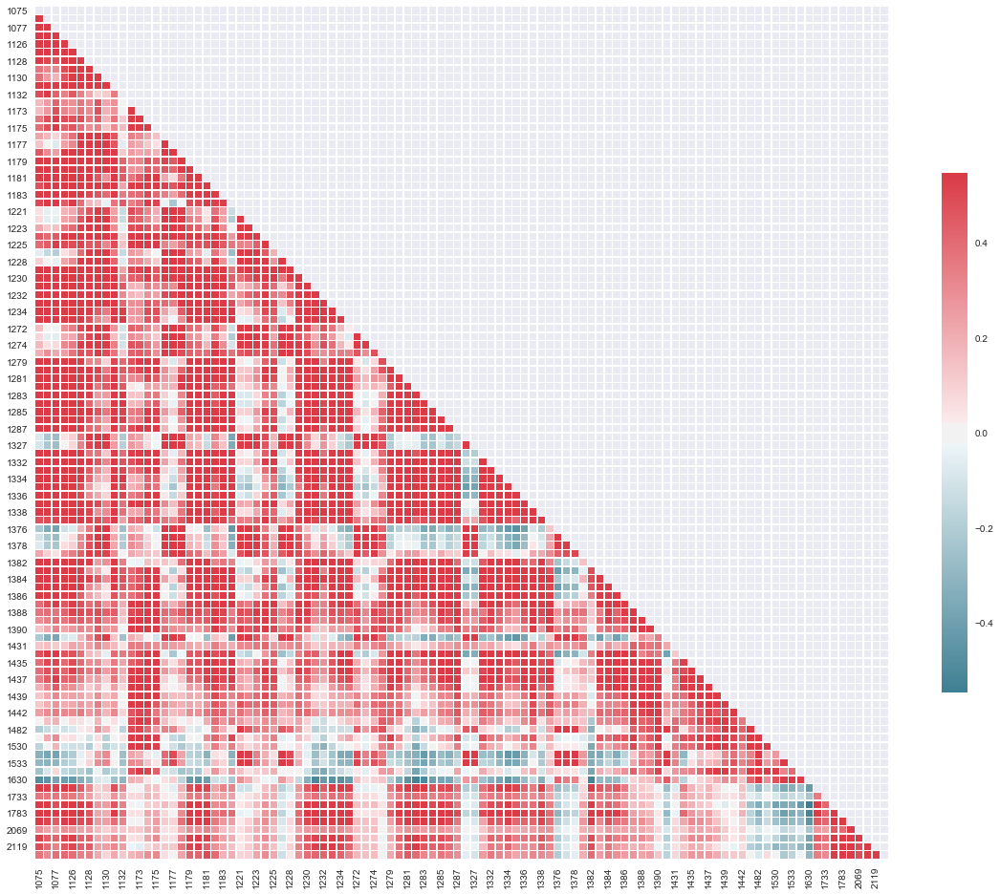

In [13]:
for key, val in colId.items():
    print key, val
    if len(val)>0:
        plt.figure()
        s2.loc[:,val].plot(figsize = [15,10])
        # Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 20))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, square=True, xticklabels=2, yticklabels=2,
            linewidths=.5, cbar_kws={"shrink": .5}, ax=ax)

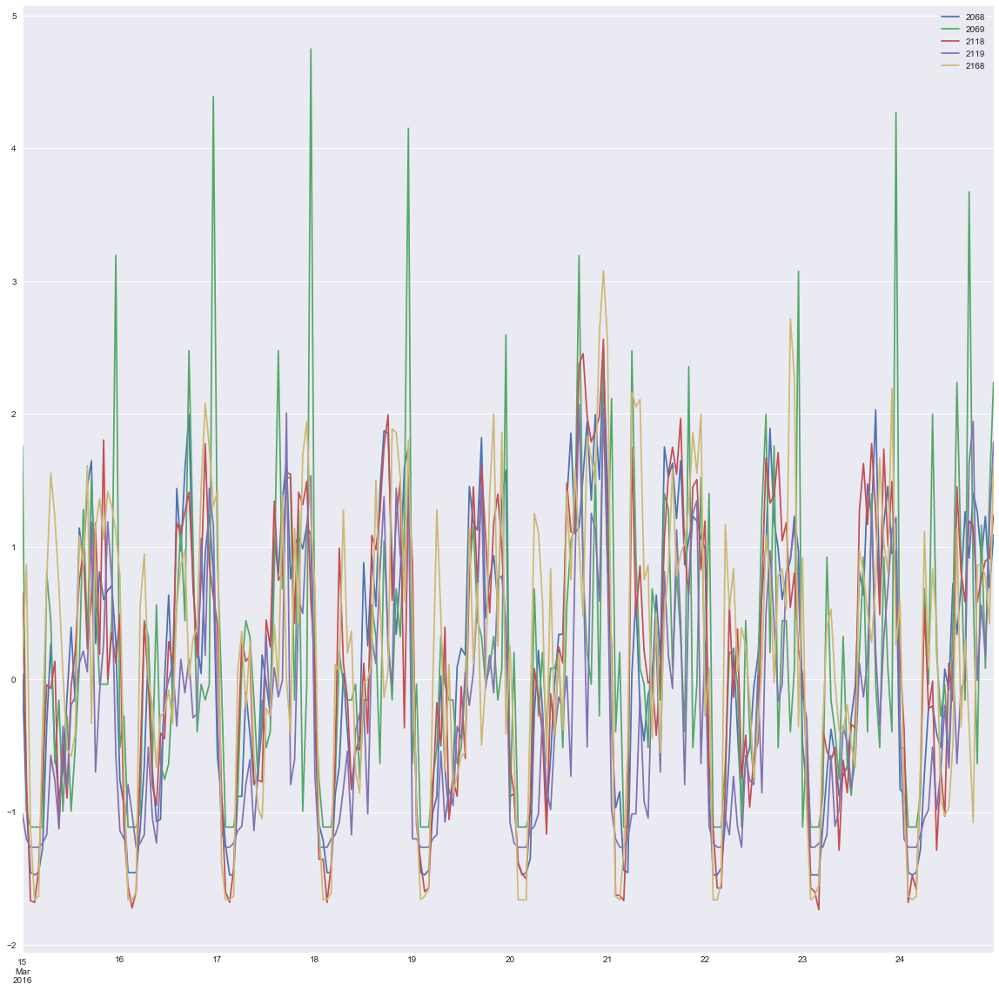

In [14]:
# попробую для начала немного разобрать руками
# аэропорт John Kennedy International
JKI = ['2068','2069','2118','2119','2168']
s2.loc['2016-03-15':'2016-03-24',JKI].plot(figsize=[20,20])

,2068,2118,2168
2068,1.000000,0.863124,0.574581
2118,0.863124,1.000000,0.690144
2168,0.574581,0.690144,1.000000


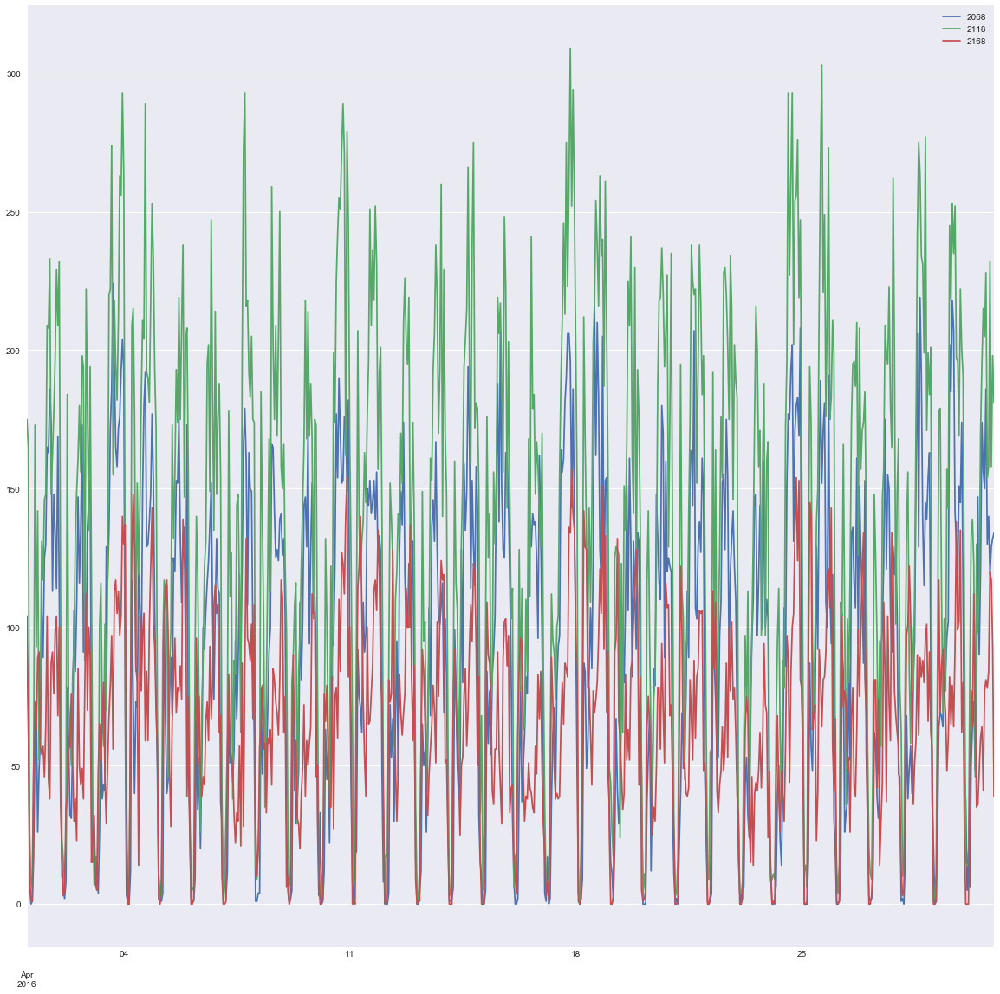

In [15]:
s3 = df.loc['2016-04-01':'2016-04-30',['2068','2118','2168']]
s3.plot(figsize=[20,20])
s3.corr()

In [16]:
s2.loc[:,JKI].corr()

,2068,2069,2118,2119,2168
2068,1.000000,0.595983,0.839620,0.779376,0.642052
2069,0.595983,1.000000,0.587547,0.492480,0.483494
2118,0.839620,0.587547,1.000000,0.710156,0.728609
2119,0.779376,0.492480,0.710156,1.000000,0.540266
2168,0.642052,0.483494,0.728609,0.540266,1.000000


Ничего хорошего не получилось. Мне так кажется. Возможно, мне не хватает мозгов, чтобы понять что-то.

In [17]:
import numpy.fft as fft
F = fft.fft(df2,axis = 0)

In [30]:
Amp = fft.fftshift(np.abs(F)) 
X = fft.fftshift(np.real(F))
Y = fft.fftshift(np.imag(F))
freqScale = fft.fftshift(fft.fftfreq(X.shape[0]))

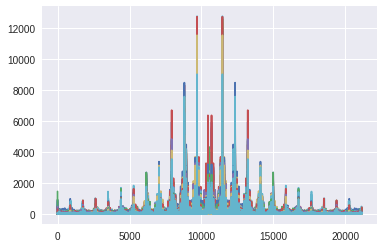

In [31]:
#plt.figure(figsize=[20,10])
plt.plot(Amp)
wind = 5000;
left = 10572
right = 20000
#plt.xlim([left, right])

In [32]:
# position of maximum
FFTinds = [11075, 11201, 11327, 11453, 11579, 11705, 12082, 12208, 12334, 12460, 12586, 12963, 13089, 13215, 13341, 13844, 13970, 14096, 14222, 14348, 14725, 14851, 14977, 15103]; 

In [33]:
keyPoints = Amp[FFTinds,:].T
print keyPoints.shape

n_clusters = 10;
kMean = cls.KMeans(n_clusters, random_state=0,max_iter = 1000, n_jobs = 4)

kMean.fit(keyPoints)
labels = kMean.labels_

colId = {x: list() for x in range(0,n_clusters)}

for label, col in zip(kMean.labels_,df2.columns):
    colId.get(label).append(col) 
    
print colId   

(102, 24)
{0: ['1075', '1076', '1172', '1173', '1174', '1221', '1337', '1338', '1383', '1384', '1431', '1437', '1438'], 1: ['1181', '1182', '1184', '1225', '1227', '1228', '1376', '1377', '1378', '1380'], 2: ['1127', '1128', '1129', '1281', '1282', '1326', '1327', '1483', '1530', '1783', '2068', '2069', '2118', '2119'], 3: ['1131', '1175', '1233', '1272', '1273', '1278', '1279', '1280', '1339'], 4: ['1077', '1125', '1126', '1176', '1177', '1178', '1179', '1223', '1331', '1332', '1333', '1334', '1335', '1385', '1386', '1387', '1390', '1442', '1480', '1482', '1684', '1733', '1734', '2168'], 5: ['1283', '1284', '1285', '1286'], 6: ['1180', '1232', '1234', '1235', '1274', '1287'], 7: ['1130', '1132', '1224', '1389', '1426', '1434', '1435', '1532', '1533', '1580'], 8: ['1336', '1382', '1388', '1439', '1441'], 9: ['1183', '1222', '1229', '1230', '1231', '1436', '1630']}


In [34]:
labels.shape

(102,)

In [18]:
for key, val in colId.items():
    print key, val
    if len(val)>0:
        #plt.figure()
        #df2.loc['2014-01-01':'2014-02-01',val].plot()

IndentationError: expected an indented block (<ipython-input-18-9b49a07c2f29>, line 5)

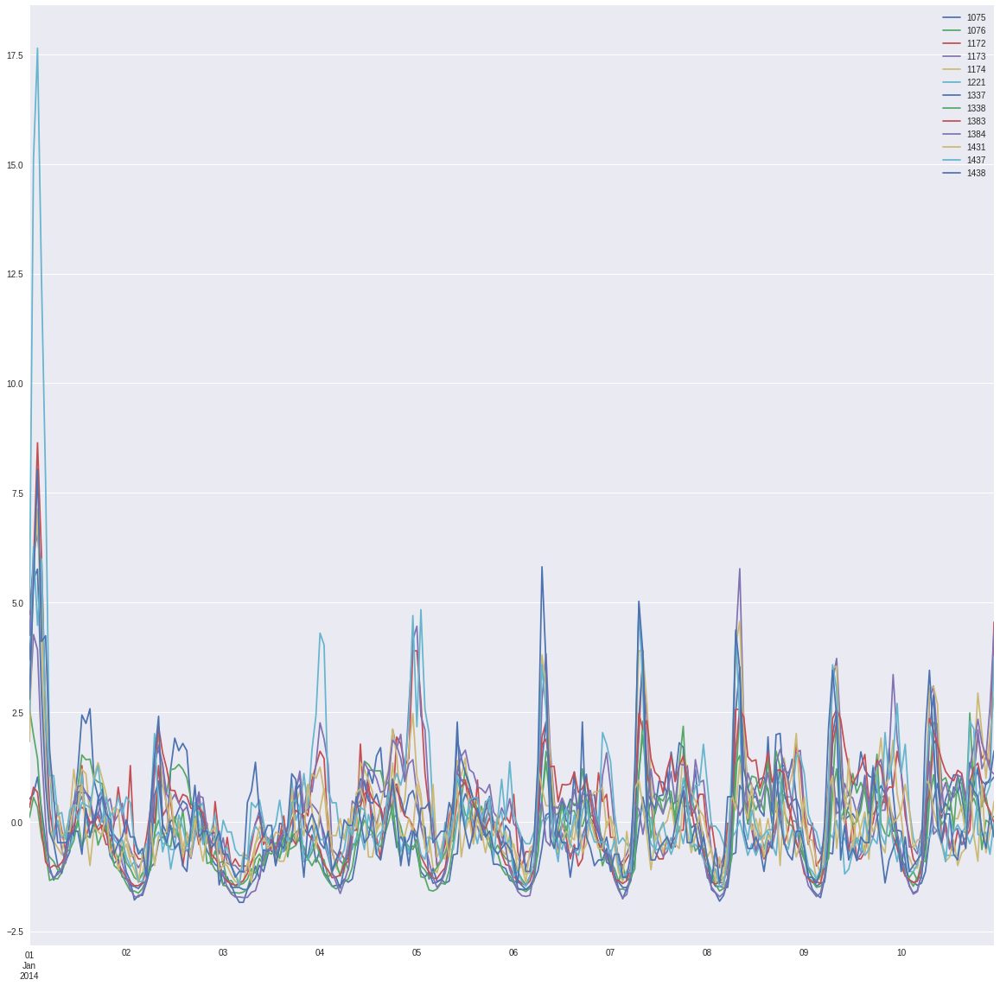

In [36]:
df2.loc['2014-01-01':'2014-01-10',colId.get(0)].plot(figsize=[20,20])

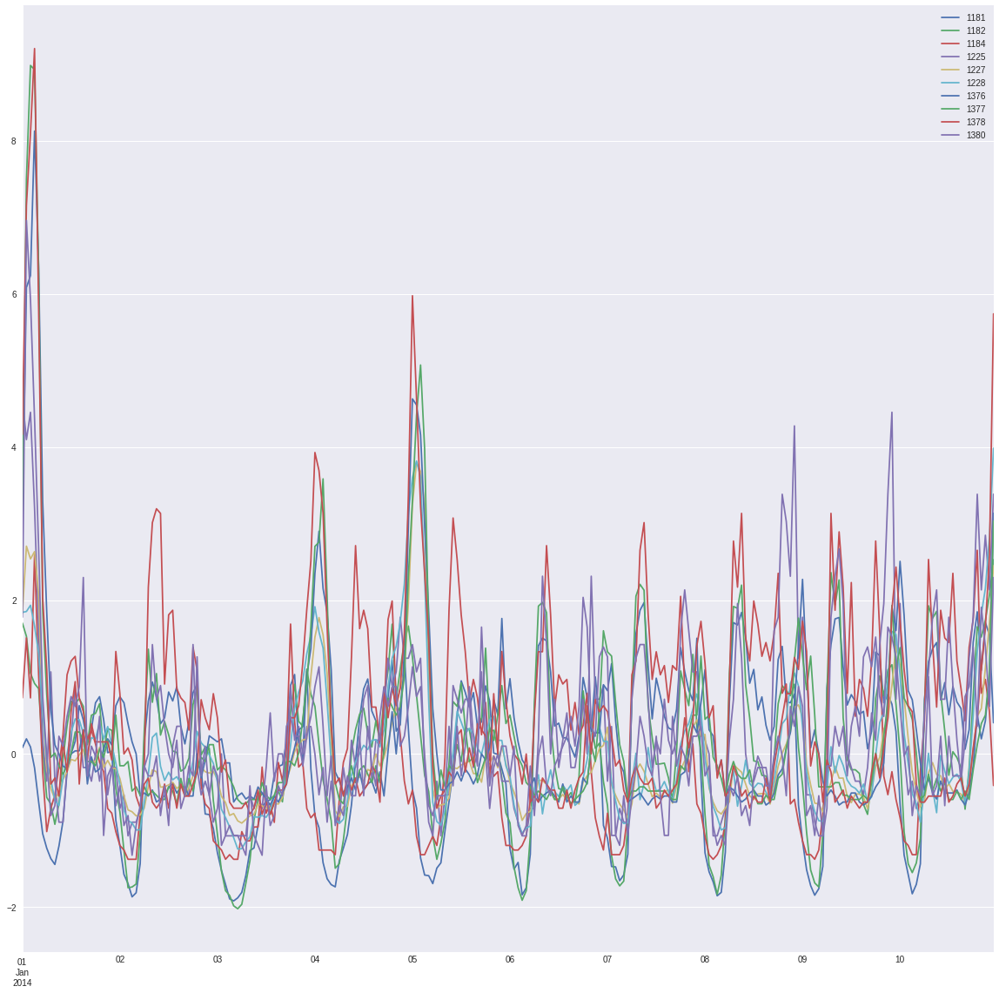

In [37]:
df2.loc['2014-01-01':'2014-01-10',colId.get(1)].plot(figsize=[20,20])

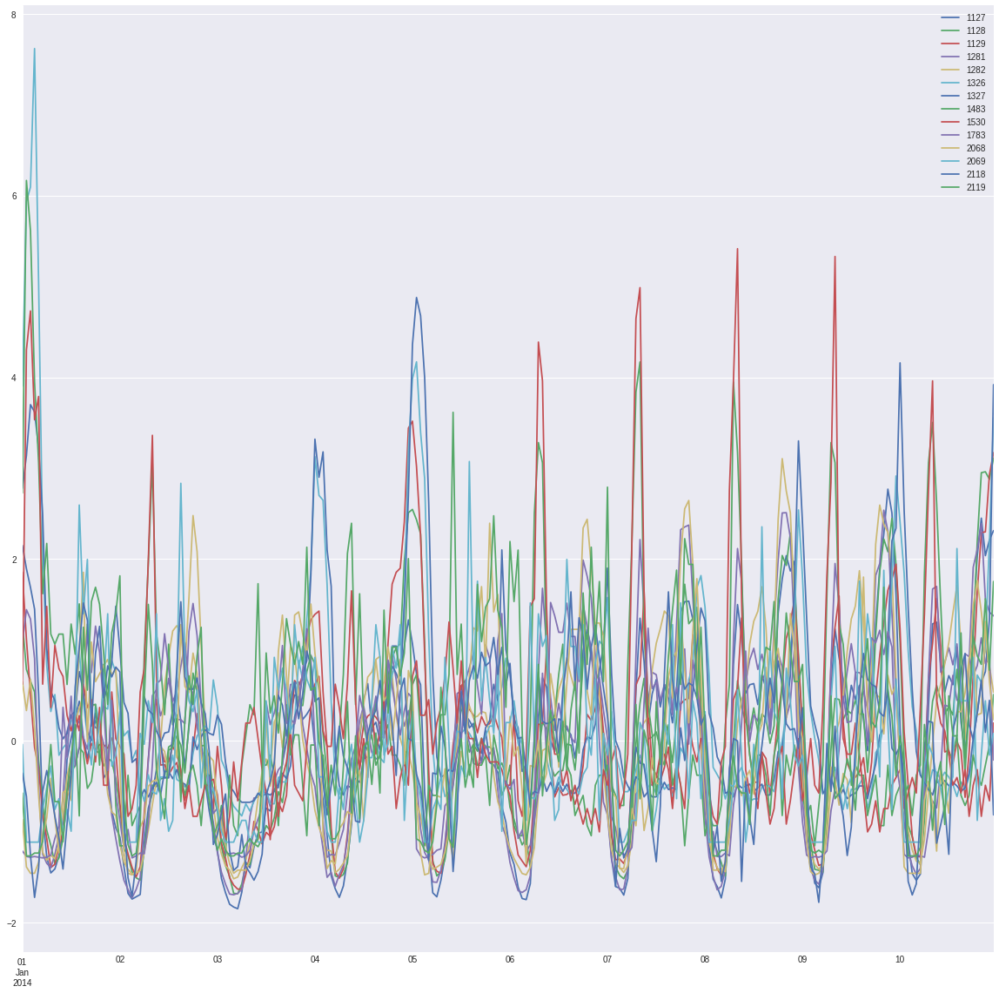

In [39]:
df2.loc['2014-01-01':'2014-01-10',colId.get(2)].plot(figsize=[20,20])

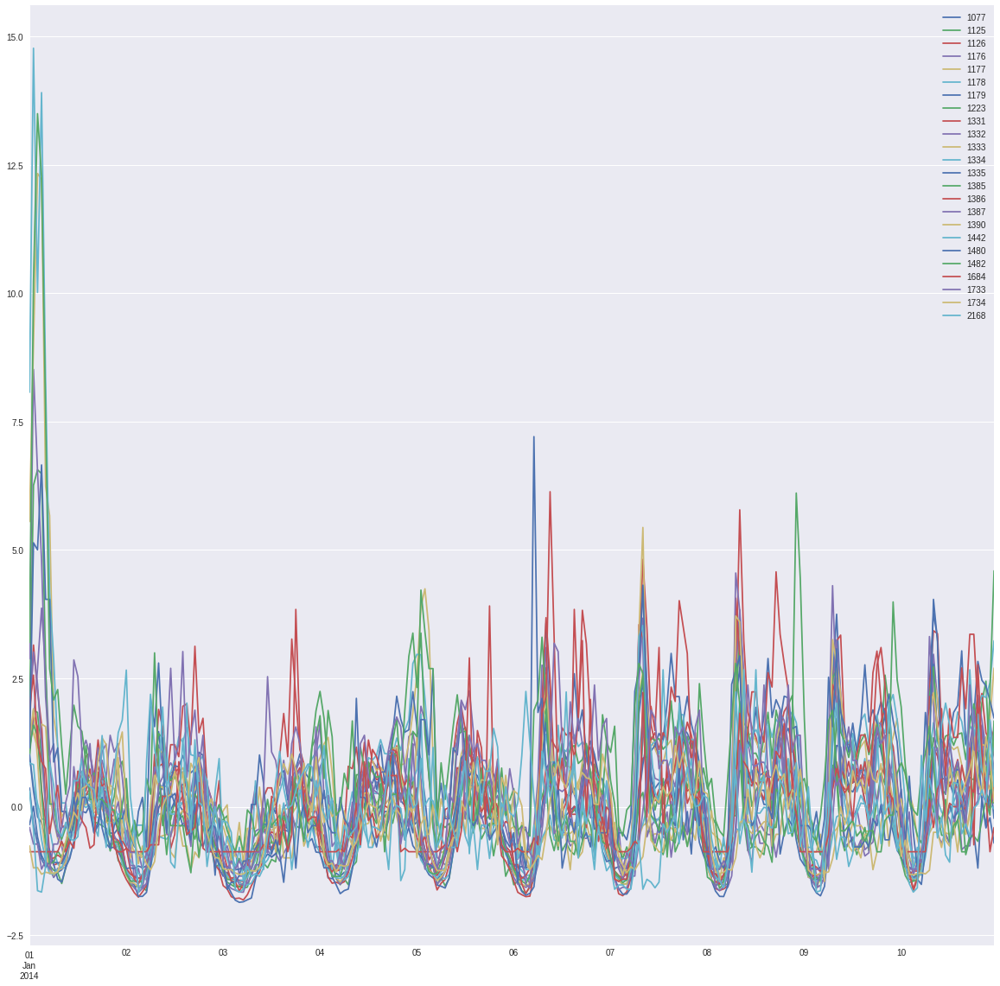

In [40]:
df2.loc['2014-01-01':'2014-01-10',colId.get(4)].plot(figsize=[20,20])

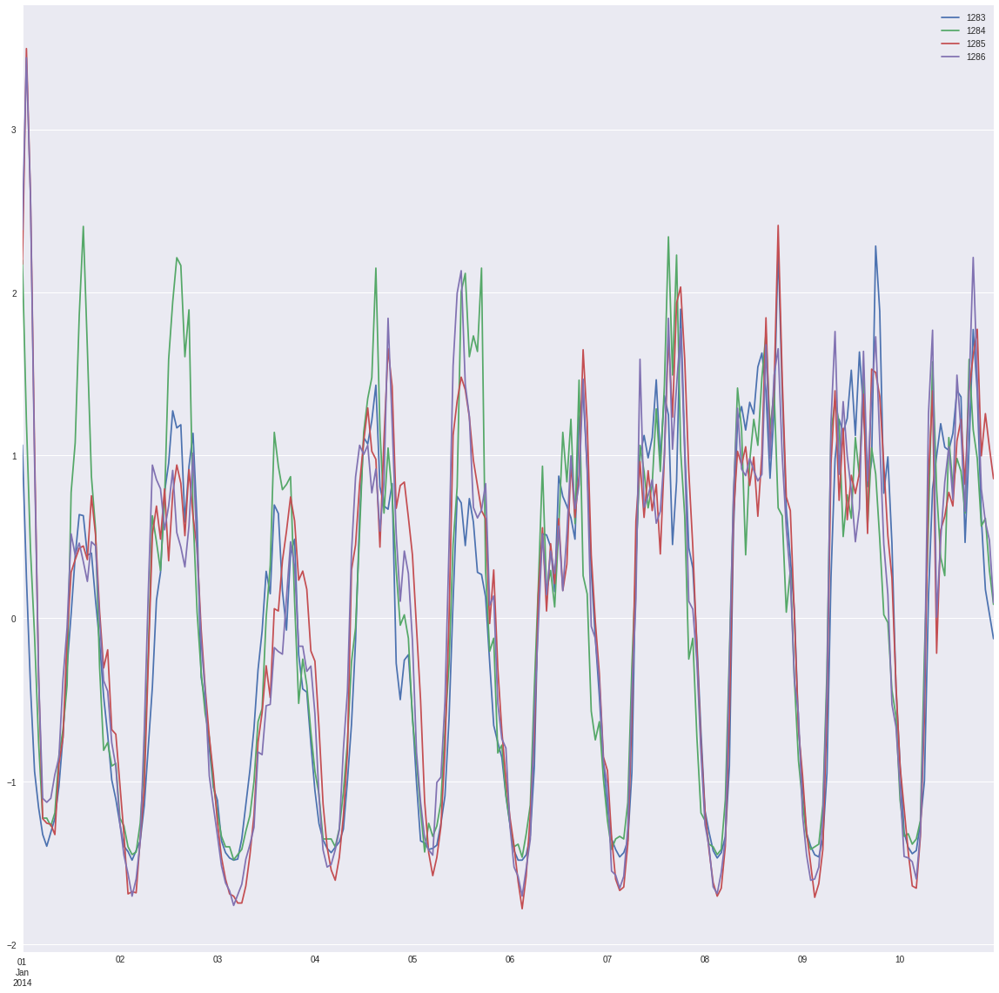

In [41]:
df2.loc['2014-01-01':'2014-01-10',colId.get(5)].plot(figsize=[20,20])

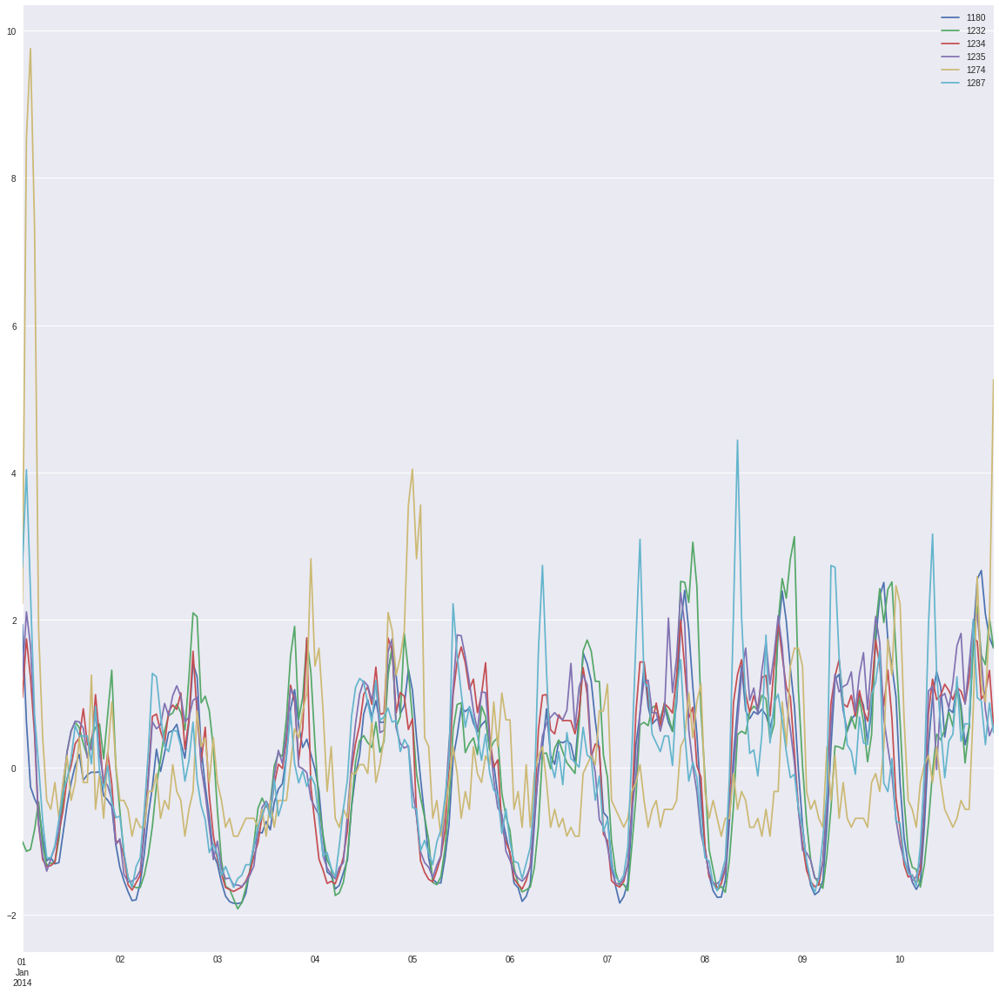

In [42]:
df2.loc['2014-01-01':'2014-01-10',colId.get(6)].plot(figsize=[20,20])

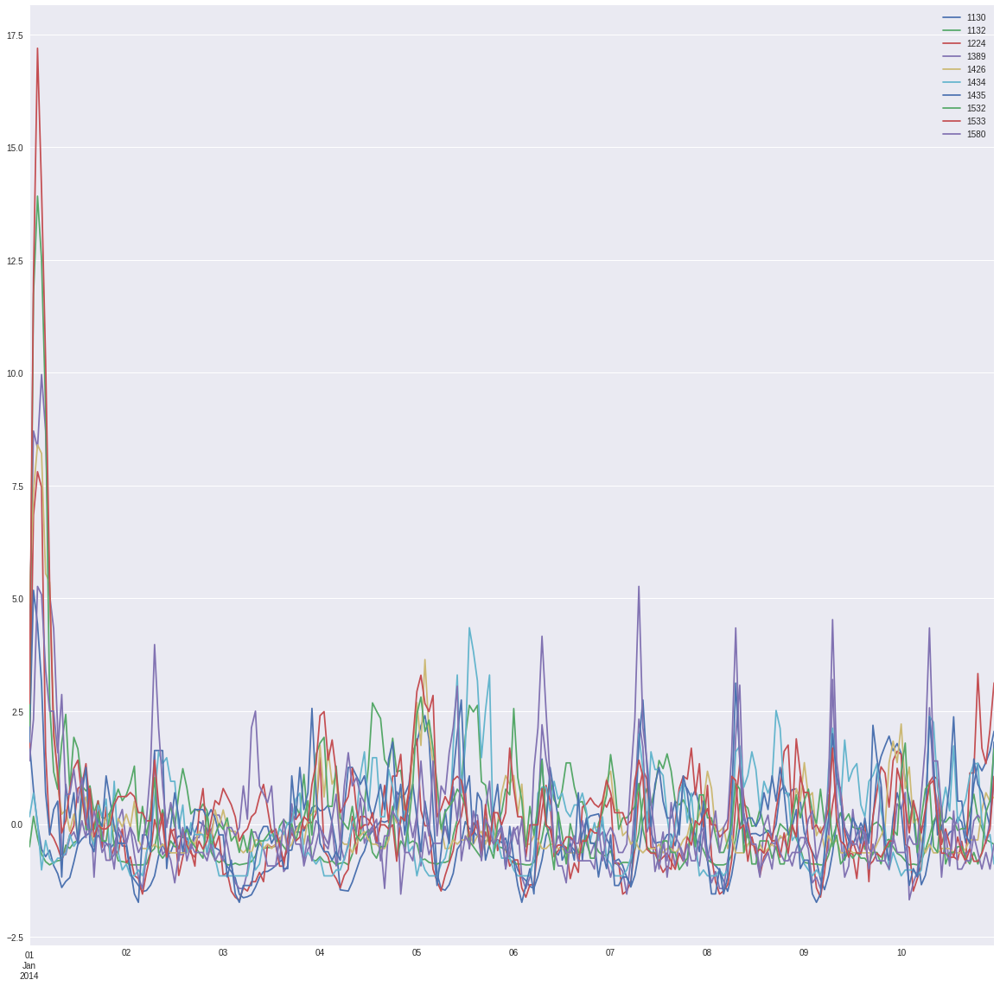

In [43]:
df2.loc['2014-01-01':'2014-01-10',colId.get(7)].plot(figsize=[20,20])

(-2, 6)

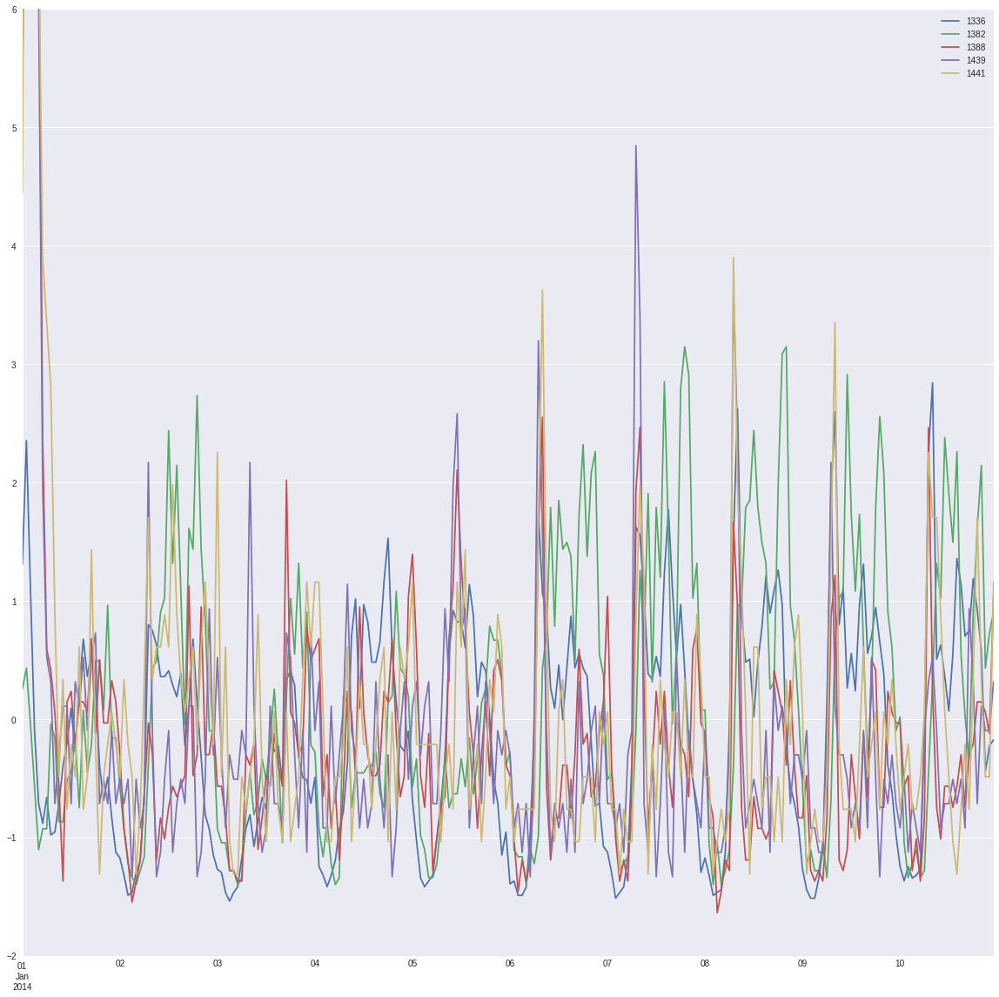

In [44]:
df2.loc['2014-01-01':'2014-01-10',colId.get(8)].plot(figsize=[20,20])
plt.ylim([-2, 6])

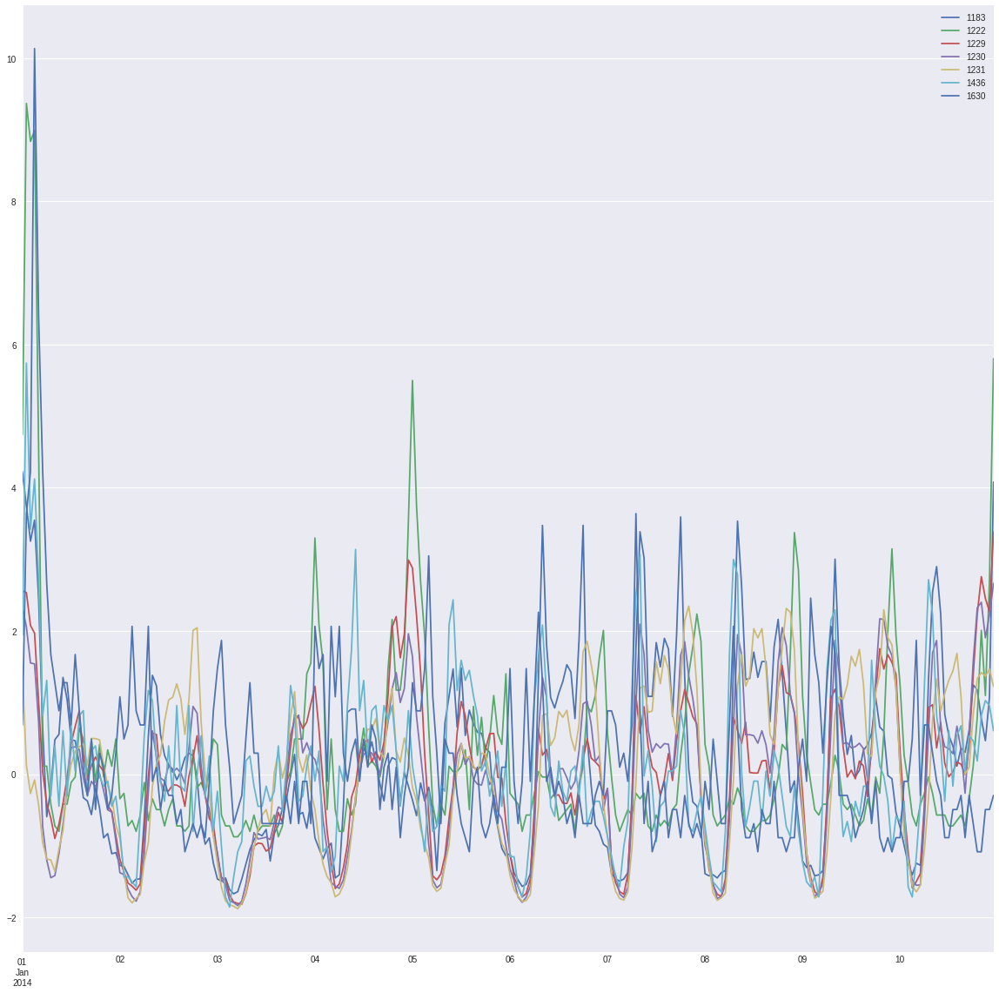

In [46]:
df2.loc['2014-01-01':'2014-01-10',colId.get(9)].plot(figsize=[20,20])

####  Попробую по другому посчитать опорные точки.
1) Усредню спектр.
2) Сделаю dropout
3) Выберу только точки спектра, интенсивность которых выше некоторого критического значения.

In [47]:
avgSpec = Amp.mean(axis = 1)
avgSpec = avgSpec/avgSpec.max()

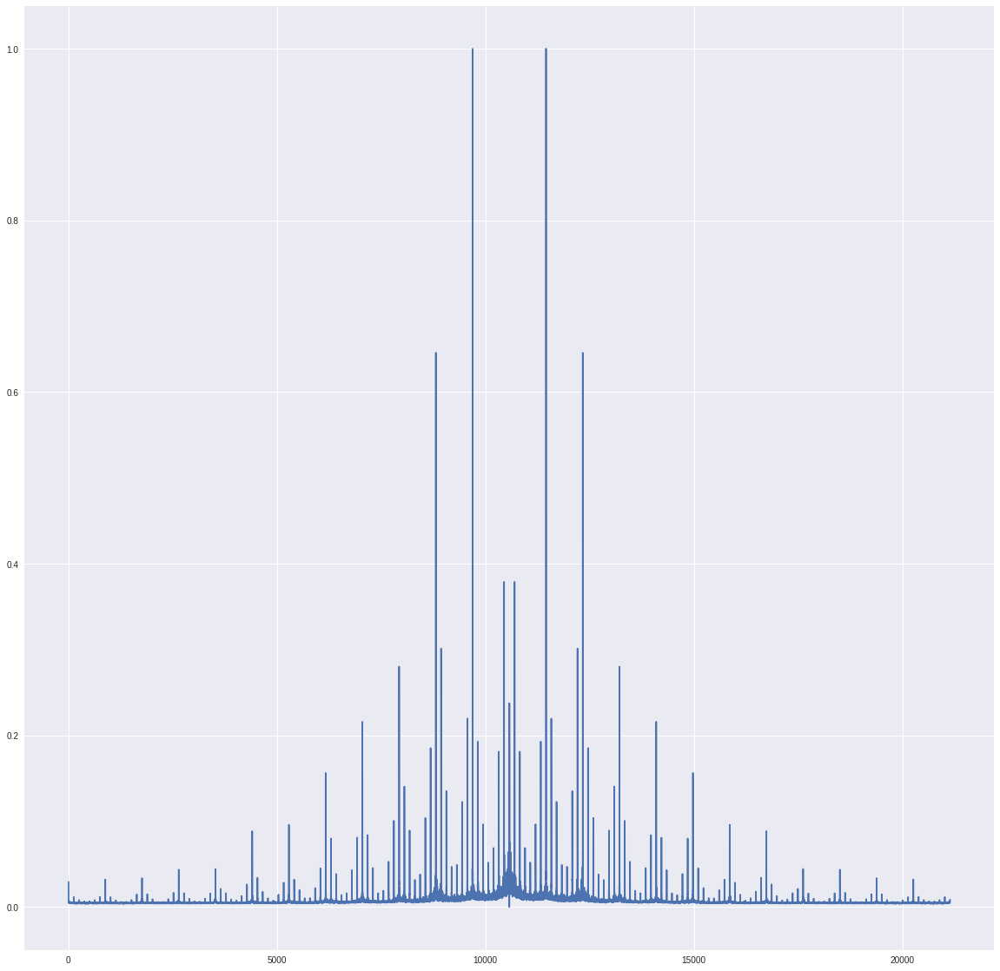

In [48]:
plt.figure(figsize = [20,20])
plt.plot(avgSpec)

In [49]:
FFTinds = [i for i,v in enumerate(avgSpec) if ((v > 0.01) & (i>avgSpec.shape[0]/2))]

In [50]:
import sklearn.cluster as cls

keyPoints = Amp[FFTinds,:].T
print keyPoints.shape

n_clusters = 20;
kMean = cls.KMeans(n_clusters, random_state=0,max_iter = 1000, n_jobs = 4)

kMean.fit(keyPoints)
labels = kMean.labels_

colId = {x: list() for x in range(0,n_clusters)}

for label, col in zip(kMean.labels_,df2.columns):
    colId.get(label).append(col) 
    
print colId   

(102, 1454)
{0: ['1127', '1128', '1326', '1783', '2068', '2069'], 1: ['1336', '1382', '1388', '1439', '1630'], 2: ['1181', '1227', '1228'], 3: ['1132', '1175', '1224', '1389', '1426', '1434', '1435', '1532', '1533', '1580'], 4: ['1075', '1076', '1172', '1173', '1174', '1221', '1338', '1431'], 5: ['1376', '1377', '1378', '1380', '1436'], 6: ['1077', '1125', '1130', '1176', '1177', '1178', '1331', '1387', '1684', '1733', '2168'], 7: ['1180', '1232', '1234', '1235', '1274'], 8: ['1126', '1129', '1179', '1223', '1327', '1390', '1483', '1530', '2118', '2119'], 9: ['1283', '1284', '1285', '1286'], 10: ['1182', '1183', '1184', '1222', '1225', '1229', '1230', '1231'], 11: ['1337', '1383', '1437', '1438'], 12: ['1281', '1282'], 13: ['1131'], 14: ['1233'], 15: ['1287'], 16: ['1339'], 17: ['1272', '1273', '1278'], 18: ['1332', '1333', '1334', '1335', '1384', '1385', '1386', '1441', '1442', '1480', '1482', '1734'], 19: ['1279', '1280']}


## Посмотрим на распределения рядов по частоте

In [179]:
# делаем гистограмму распределения по количеству поездок
nBins = 48
hists = np.ndarray([0,nBins])
for col in df2.columns:
    [hist,bins] = np.histogram(df2[col].as_matrix(),range=[-3,8],bins = nBins)
    #print hist
    hists = np.vstack([hists,hist])
    
histDf = pd.DataFrame(hists.transpose(),index = np.arange(nBins), columns = df2.columns.values)    

In [183]:
def kMeansSeries(ts, n_clusters = 20, max_iter = 1000, random_state = 0):
    """
    Кластеризация временных рядов. Строит полученные кластеры и возвращает словарь {номео кластера: [id регионов]}
    ts - временные ряды (pandas dataframe)
    n_clusters - количество кластеро (n_clusters = 20)
    """
    kMean = skl_cls.KMeans(n_clusters, random_state = random_state, max_iter = max_iter, n_jobs = 4)
    kMean.fit(ts)
    labels = kMean.labels_

    clusters = {x: list() for x in range(0,n_clusters)}

    for label, col in zip(kMean.labels_,ts.columns):
        clusters.get(label).append(col)
    clusters = {key: val for key, val in clusters.items() if val}    
    
    print clusters    
    return clusters

def plotGroups(ts,grs):
    for (k, v) in grs.iteritems():
        plt.figure()
        ts.loc[:,v].plot(figsize=[20,10])
        plt.title('Group #'+str(k), fontsize = 14)

In [174]:
cls = kMeansSeries(df2.loc['2016-01-02':'2016-04-30',:])

{0: ['1172', '1173', '1174', '1233', '1336', '1337', '1338', '1339', '1439', '1441', '1442', '1480'], 1: ['1127', '1287', '1326', '1327', '1390', '1426', '1431', '2069', '2118', '2119'], 3: ['1222'], 5: ['1128', '1129', '1130', '1227', '1228', '1229', '1230', '1331', '1434', '2168'], 6: ['1333', '1334', '1436'], 7: ['1131', '1132', '1231', '1232', '1332', '1435'], 9: ['1437'], 10: ['1181', '1182', '1183', '1184', '1221', '1280', '1281', '1282', '1283', '1385', '1386', '1684', '1733'], 11: ['1223', '1224', '1225'], 12: ['1335', '1438'], 15: ['1382', '1383', '1533', '1580', '1630'], 17: ['1175', '1176', '1177', '1178', '1179', '1180', '1234', '1235', '1272', '1273', '1274', '1278', '1279', '1376', '1377', '1378', '1380', '1384', '1482', '1483', '1530', '1532'], 18: ['1077', '1125', '1126', '1286', '1389', '2068'], 19: ['1075', '1076', '1284', '1285', '1387', '1388', '1734', '1783']}


In [19]:
#plotGroups(df2.loc['2016-02-01':'2016-02-10',:],cls)        

In [20]:
#plotGroups(df2.loc['2016-01-02':'2016-01-10',:],cls_agl)  

Group 0 - только один элемент

Group 1 - очень много элементов, попробовать разбить ещё раз

Group 2 - видимо, все ряды расположены рядом друг с другом. Аэропорт? Попробовать разбить на две группы

Group 3 - всё хорошо (2 ряда)

Group 4 - сгодится

Group 5 - очень много элементов, попробовать разбить ещё раз

Group 6 - всё отлично (2 ряда)

Group 7 - всё отлично (2 ряда)

Group 8 - много элементов, но выглядит однородно

Group 9 - хорошо (2 ряда)

Group 10 - 1 ряд. Попробовать пристыковать его куда-нибудь.

Group 11 - хорошо.

Group 15 - всё плохо

Group 16 - только один ряд, пристыковать к другой группе.

Group 17 - неплохо.

Group 18 - неплохо.

Group 19 - разобрать на две.

### Итого получается 17 непустых групп.
Следует разделить руками группы #2 (сделано) и #19 (сделано).

Группы с одним рядом - #0, #10, #16. (+)

Провести повторную классификацию - группы #1, #5, #15 

In [242]:
def agglSeries(ts, n_clusters = 20, max_iter = 1000, random_state = 0):
    """
    Кластеризация временных рядов. Строит полученные кластеры и возвращает словарь {номео кластера: [id регионов]}
    ts - временные ряды (pandas dataframe)
    n_clusters - количество кластеро (n_clusters = 20)
    """
    #affinity='euclidean', memory=Memory(cachedir=None)
    # connectivity=None, compute_full_tree='auto', linkage='ward'
    kMean = skl_cls.AgglomerativeClustering(n_clusters)
    kMean.fit(ts)
    labels = kMean.labels_

    colId = {x: list() for x in range(0,n_clusters)}

    for label, col in zip(kMean.labels_,ts.columns):
        colId.get(label).append(col)
    colId = {key: val for key, val in colId.items() if val}    
    
    print colId
    
    #plotGroups(ts,colId)
    
    return colId

cls_agl = agglSeries(df2.loc['2016-01-02':'2016-04-30',:])



{0: ['1077', '1125', '1126', '1127', '1128', '1129', '1227', '1228', '1229', '1286', '1287', '1326', '1327', '1331', '1389', '1390', '1426', '1431', '1434', '2068', '2069', '2118', '2119', '2168'], 1: ['1181', '1182', '1183', '1221', '1222', '1280', '1281', '1282', '1385', '1386', '1684', '1733', '1734'], 2: ['1173', '1174', '1175', '1176', '1177', '1178', '1179', '1180', '1234', '1235', '1272', '1273', '1274', '1278', '1279'], 3: ['1223', '1224', '1225'], 4: ['1382', '1383', '1384', '1580', '1630'], 5: ['1075', '1076', '1283', '1284', '1285', '1387', '1388', '1783'], 7: ['1130', '1131', '1230', '1231'], 8: ['1184'], 9: ['1132', '1172', '1233', '1333', '1438'], 11: ['1437'], 12: ['1232'], 13: ['1376', '1377', '1378', '1380', '1483', '1530', '1532', '1533'], 14: ['1335', '1336', '1337', '1338', '1339', '1439', '1441', '1442', '1480', '1482'], 16: ['1332', '1435'], 18: ['1334', '1436']}


In [2]:
plotGroups(ts,cls_agl)

NameError: name 'plotGroups' is not defined

# Группа #2 - разобрать на две

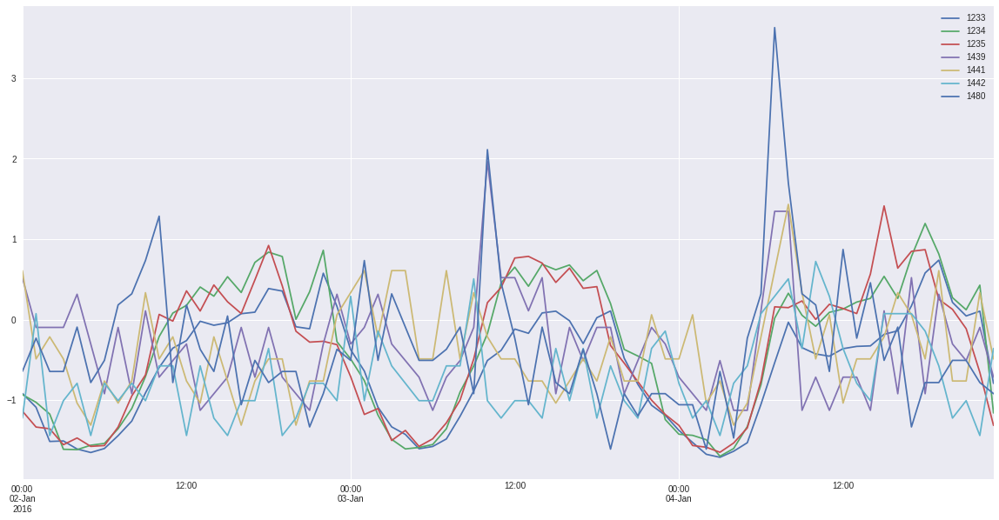

In [240]:
df2.loc['2016-01-02':'2016-01-4',colId[2]].plot(figsize=[20,10])

Разбить группу #2 на две

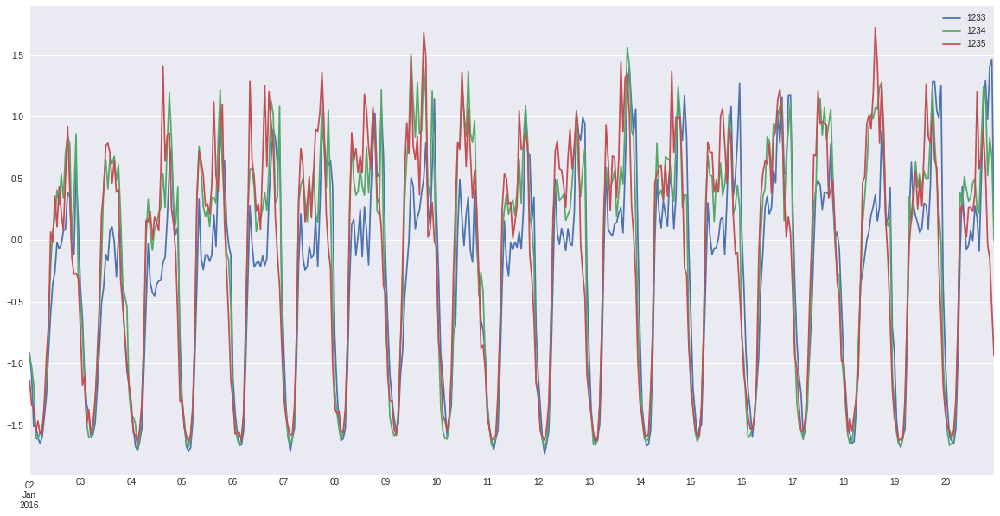

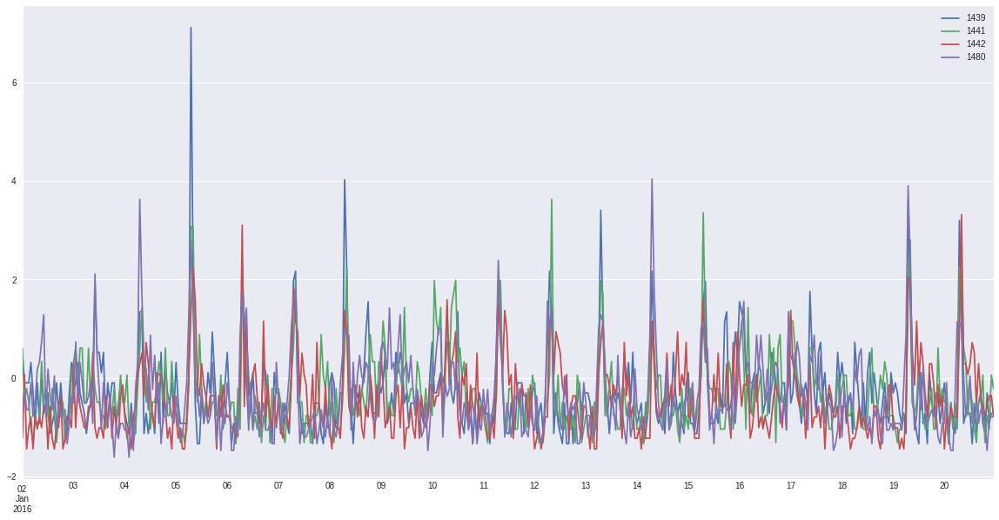

In [262]:
group21 = ['1233','1234','1235']
group22 = ['1439','1441','1442','1480']
df2.loc['2016-01-02':'2016-01-20',group21].plot(figsize = [20, 10])
df2.loc['2016-01-02':'2016-01-20',group22].plot(figsize = [20, 10])

# Группа #19 - разобрать на две

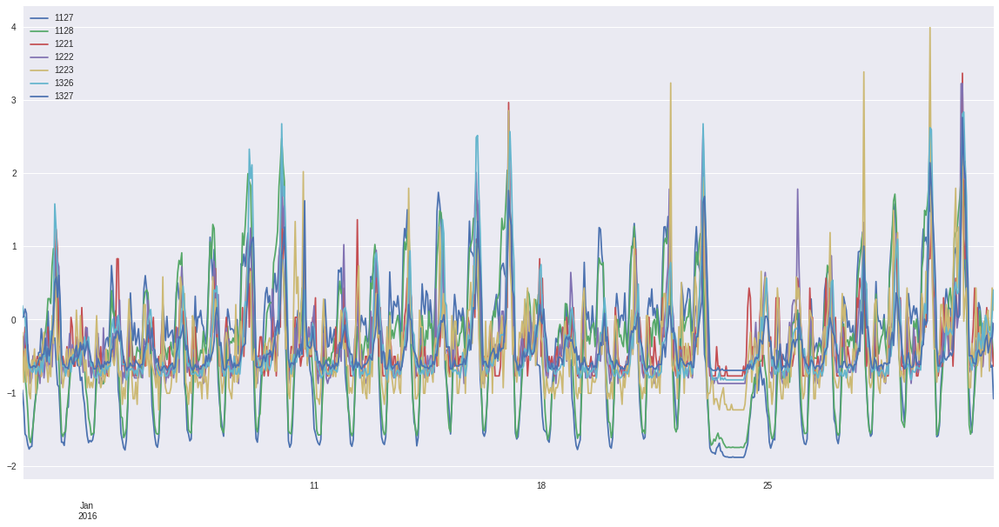

In [256]:
df2.loc['2016-01-02':'2016-01-31',colId[19]].plot(figsize=[20,10])

(-2, 5)

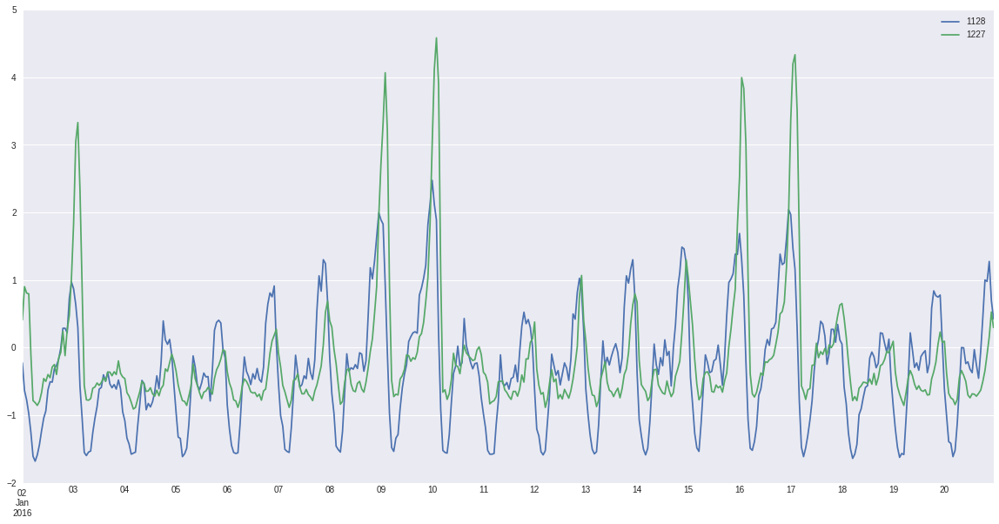

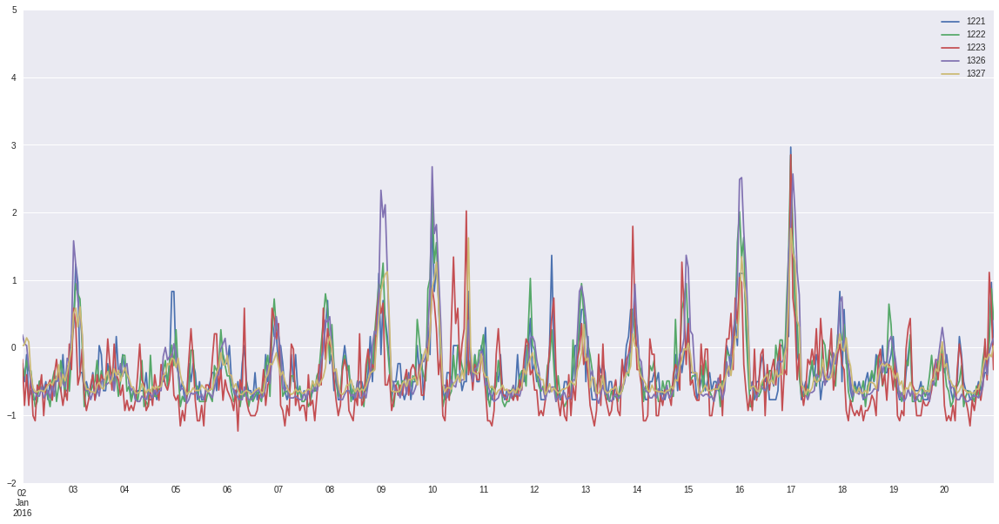

In [261]:
group31 = ['1128','1227']
group32 = ['1221','1222','1223','1326','1327']
df2.loc['2016-01-02':'2016-01-20',group31].plot(figsize = [20, 10])
plt.ylim([-2, 5])

df2.loc['2016-01-02':'2016-01-20',group32].plot(figsize = [20, 10])
plt.ylim([-2, 5])

group32 вполне себе хороша. А group31 не очень. Свалю её в общий котёл и заново проведу кластеризацию.

## Группы с одним рядом - #0, #10, #16.

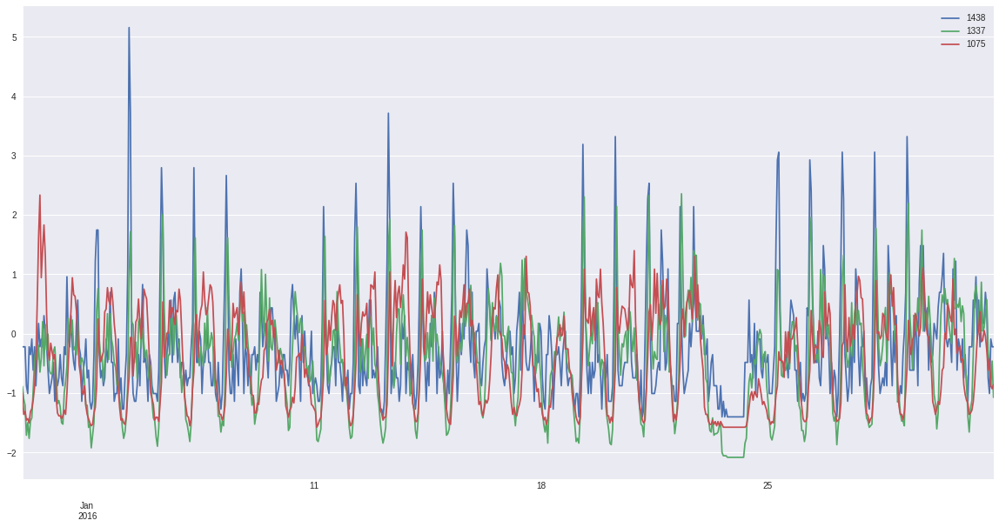

In [284]:
monoGroup = [colId[gr][0] for gr in [0,10,16]]
df2.loc['2016-01-02':'2016-01-31',monoGroup].plot(figsize = [20, 10])

Пожалуй, объединю ряды в одну группу

## Провести повторную классификацию - группы #1, #5, #15 

In [289]:
ids = colId[1]+colId[5]+colId[15]

In [301]:
n_clusters = 20;
kMean2 = cls.KMeans(n_clusters, max_iter = 10000, n_jobs = 4)
kMean2.fit(df2.loc['2016-01-01':'2016-03-1',ids])

labels = kMean2.labels_

colId2 = {x: list() for x in range(0,n_clusters)}

for label, col in zip(kMean2.labels_,df2[ids].columns):
    colId2.get(label).append(col) 

colId2 =  {k: v for k, v in colId2.items() if v}
print colId2

{0: ['1426', '1431', '2069'], 1: ['1339', '1376', '1377', '1378'], 2: ['1129'], 5: ['2068', '2168', '1177', '1178', '1273', '1274', '1278', '1279', '1280'], 6: ['1130', '1131', '1228', '1229'], 8: ['1332', '1333', '1334', '1382', '1482', '1483', '1530'], 12: ['1225', '1227', '1390'], 14: ['1230'], 16: ['1380'], 17: ['1331', '1388', '1389', '1434', '1532', '1224'], 18: ['1783', '1272', '2118', '2119']}


In [21]:
#plotGroups(df2.loc['2016-01-02':'2016-01-10',:],colId2)  

Попробую проводить циклическую кластеризацию - кластеризовать ряды, выбирать руками хорошие пары, выкидывать их из общей кучи, повторять кластеризацию

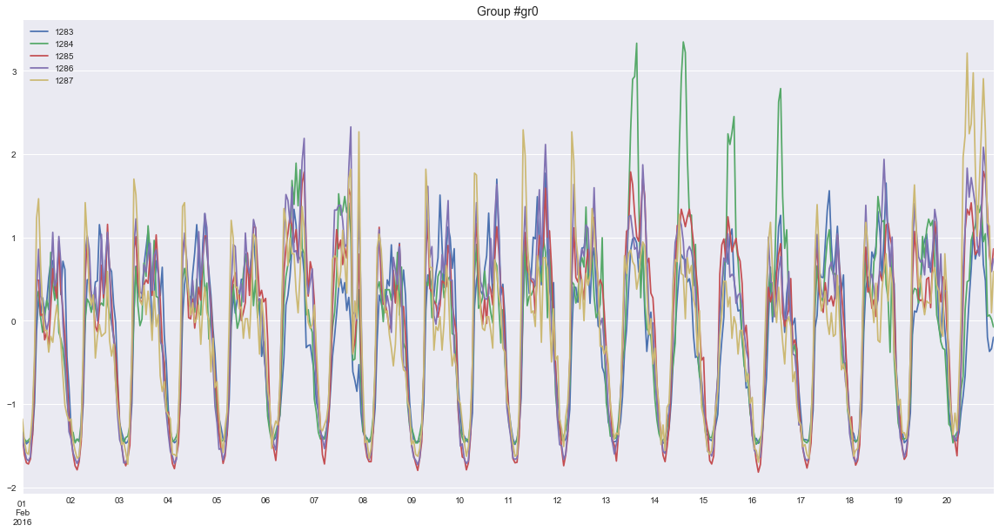

In [24]:
gr0 = {'gr0':['1283','1284','1285','1286','1287']}
plotGroups(df2.loc['2016-02-01':'2016-02-20',:],gr0)  

Вполне себе хорошая получилась группа. Принимается!

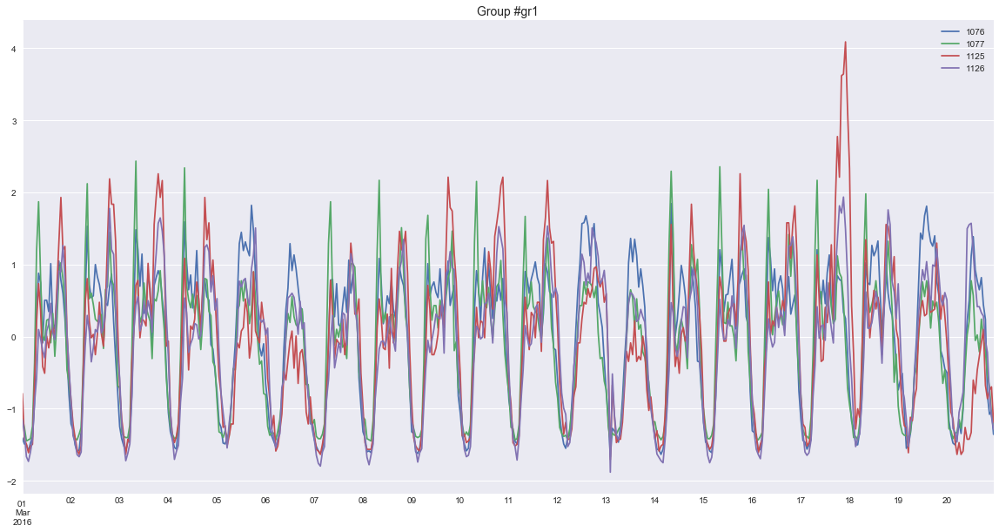

In [26]:
gr1 = {'gr1': ['1076','1077','1125','1126']}
plotGroups(df2.loc['2016-03-01':'2016-03-20',:],gr1) 

Принимаем.

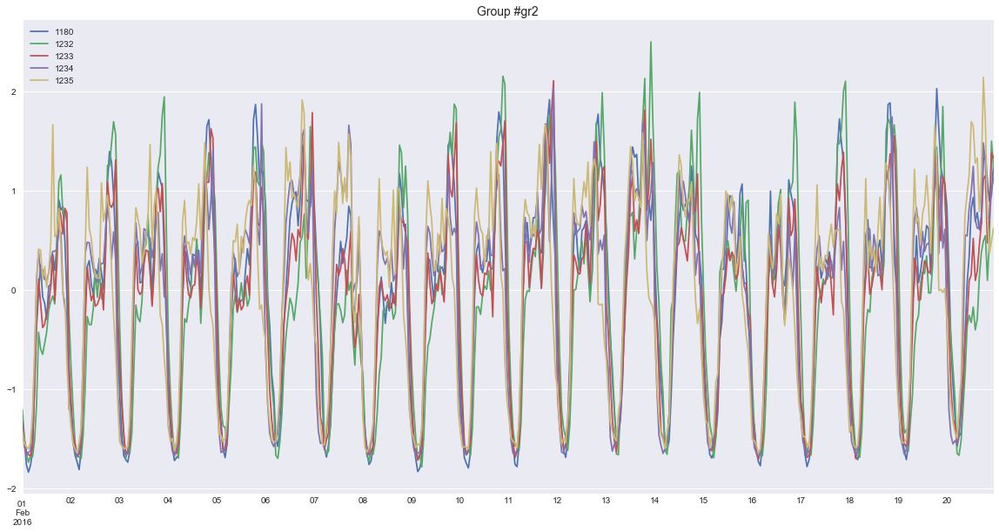

In [85]:
gr2 = {'gr2':['1180','1232','1233','1234','1235']}
plotGroups(df2.loc['2016-02-01':'2016-02-20',:],gr2) 

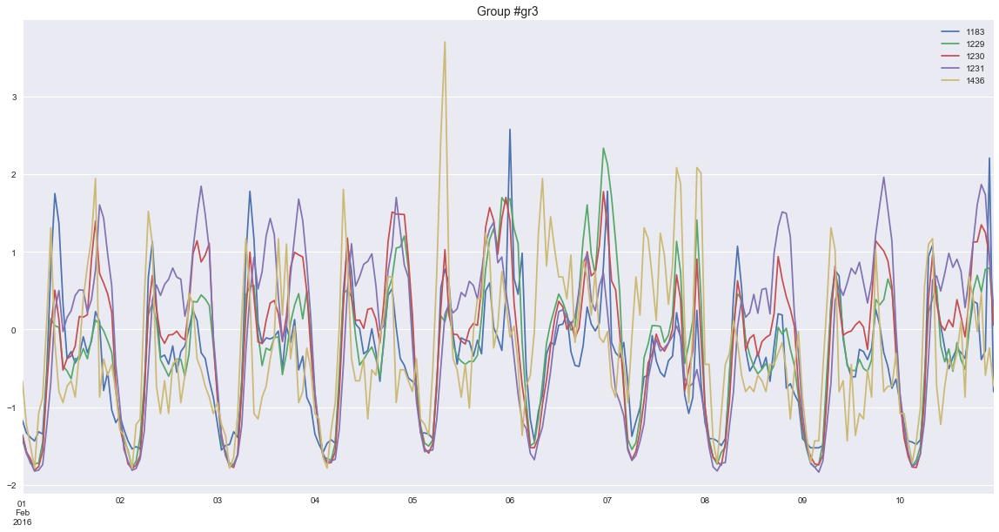

In [33]:
gr3 = {'gr3':['1183','1229','1230','1231','1436']}
plotGroups(df2.loc['2016-02-01':'2016-02-10',:],gr3) 

Получилась хорошая группа. Принимается!

Итого руками разобрано 18 рядов (из 122). Будем кластеризовать оставшиеся ряды, удалив те, что уже разобрал.

In [86]:
groups = {}
groups.update(gr0)
groups.update(gr1)
groups.update(gr2)
groups.update(gr3)
print groups

{'gr2': ['1180', '1232', '1233', '1234', '1235'], 'gr3': ['1183', '1229', '1230', '1231', '1436'], 'gr0': ['1283', '1284', '1285', '1286', '1287'], 'gr1': ['1076', '1077', '1125', '1126']}


In [278]:
colNames = list(df2.columns)
colNames.remove('1075')
print colNames

['1076', '1077', '1125', '1126', '1127', '1128', '1129', '1130', '1131', '1132', '1172', '1173', '1174', '1175', '1176', '1177', '1178', '1179', '1180', '1181', '1182', '1183', '1184', '1221', '1222', '1223', '1224', '1225', '1227', '1228', '1229', '1230', '1231', '1232', '1233', '1234', '1235', '1272', '1273', '1274', '1278', '1279', '1280', '1281', '1282', '1283', '1284', '1285', '1286', '1287', '1326', '1327', '1331', '1332', '1333', '1334', '1335', '1336', '1337', '1338', '1339', '1376', '1377', '1378', '1380', '1382', '1383', '1384', '1385', '1386', '1387', '1388', '1389', '1390', '1426', '1431', '1434', '1435', '1436', '1437', '1438', '1439', '1441', '1442', '1480', '1482', '1483', '1530', '1532', '1533', '1580', '1630', '1684', '1733', '1734', '1783', '2068', '2069', '2118', '2119', '2168']


In [282]:
def getNonClusteredSeries(ts, dc):
    """
    Возвращает список колонок из ts за вычетом колонок из словаря dc 
    """
    colNames = list(ts.columns)
    lst = []
    for k, v in dc.items():
        for c in v:
            try:
                colNames.remove(c)
            except ValueError:
                print ValueError
                print 'Group #', k, ' Columns #', c
                print colNames
            
    print 'Final length', len(colNames)
    return colNames
       
ncl1 = getNonClusteredSeries(df2,groups)

<type 'exceptions.ValueError'>
Group # gr12  Columns # 2117
['1131', '1132', '1172', '1173', '1174', '1184', '1221', '1222', '1223', '1224', '1225', '1227', '1228', '1272', '1273', '1274', '1278', '1279', '1281', '1282', '1327', '1331', '1332', '1376', '1377', '1378', '1380', '1382', '1383', '1384', '1385', '1386', '1387', '1390', '1431', '1434', '1435', '1437', '1438', '1480', '1482', '1483', '1533', '1580', '1630', '1684', '2068', '2118', '2119', '2168']
Final length 50


In [283]:
groups

{'gr0': ['1283', '1284', '1285', '1286', '1287'],
 'gr1': ['1076', '1077', '1125', '1126'],
 'gr10': ['1333', '1337', '1338', '1339', '1783'],
 'gr11': ['1075', '1733', '1734'],
 'gr12': ['2069', '2117'],
 'gr2': ['1180', '1232', '1233', '1234', '1235'],
 'gr3': ['1183', '1229', '1230', '1231', '1436'],
 'gr4': ['1127', '1128', '1129', '1130'],
 'gr6': ['1177', '1326', '1426', '1176'],
 'gr7': ['1388', '1389'],
 'gr8': ['1175',
  '1178',
  '1179',
  '1181',
  '1182',
  '1280',
  '1334',
  '1335',
  '1336',
  '1439',
  '1441',
  '1442'],
 'gr9': ['1530', '1532']}

Кластеризуем оставшиеся

In [180]:
raw4 = kMeansSeries(df2.loc['2016-01-01':'2016-03-1',ncl1])


{0: ['1179', '1181', '1182', '1184', '1221', '1222', '1223', '1224', '1225', '1227', '1376', '1377', '1378', '1482', '1483', '1530', '1532', '1533'], 1: ['2119'], 2: ['1274', '1278', '1279', '1684', '1733', '1734'], 3: ['1383', '1384'], 4: ['2069', '2118'], 5: ['1332', '1334', '1335', '1336', '1337', '1338', '1339', '1435', '1437', '1438', '1439', '1441', '1442', '1480'], 7: ['1127', '1128', '1129', '1130'], 8: ['1178', '1431', '1434'], 11: ['1176', '1177', '1326', '1327', '1426', '2068'], 13: ['1075'], 14: ['1131', '1132', '1228', '1272', '1273', '1385', '1386'], 15: ['1172', '1173', '1174', '1175', '1280', '1281', '1282', '1387', '1388', '1389', '1390', '1580', '1630', '1783'], 17: ['1331', '1333', '2168'], 18: ['1380', '1382']}


In [22]:
#plotGroups(df2.loc['2016-01-01':'2016-01-15',ncl],raw4)        

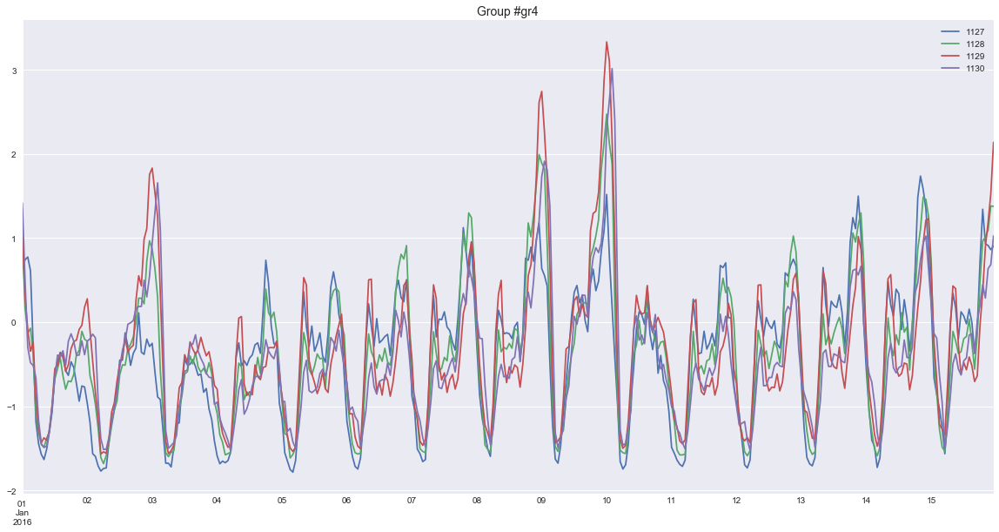

In [186]:
gr4 = {'gr4': ['1127','1128','1129','1130']}
plotGroups(df2.loc['2016-01-01':'2016-01-15',ncl],gr4)        

Хорошая группа. Добавляем в основной словарь.

In [187]:
groups.update(gr4)
print groups

{'gr4': ['1127', '1128', '1129', '1130'], 'gr2': ['1180', '1232', '1233', '1234', '1235'], 'gr3': ['1183', '1229', '1230', '1231', '1436'], 'gr0': ['1283', '1284', '1285', '1286', '1287'], 'gr1': ['1076', '1077', '1125', '1126']}


Посмотри на группу #11

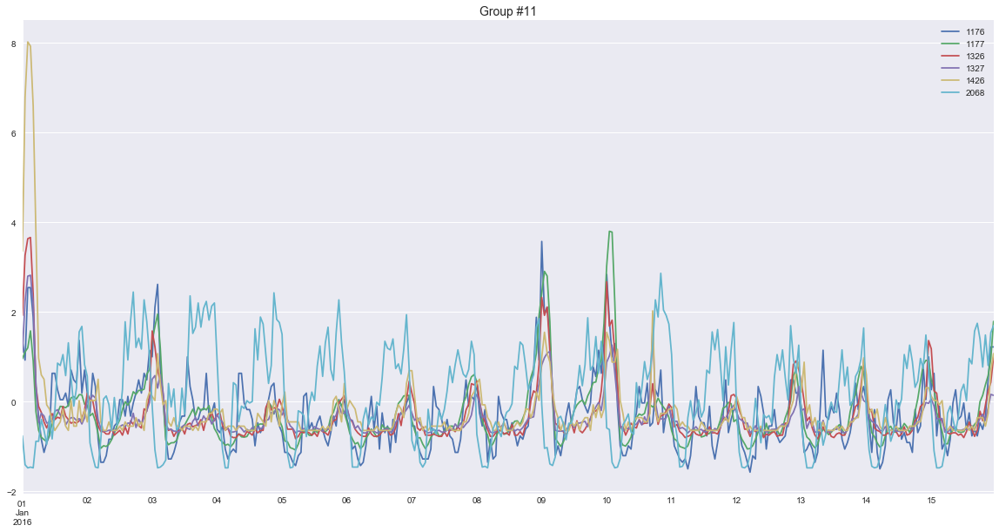

In [203]:
plotGroups(df2.loc['2016-01-01':'2016-01-15',ncl],{11: raw4.get(11)})

Удалим ряд 2068 и создадим группу 

In [23]:
gr5 = {'gr5':['1176','1177','1326','1327','1426']}
#plotGroups(df2.loc['2016-01-01':'2016-01-15',ncl],gr5)

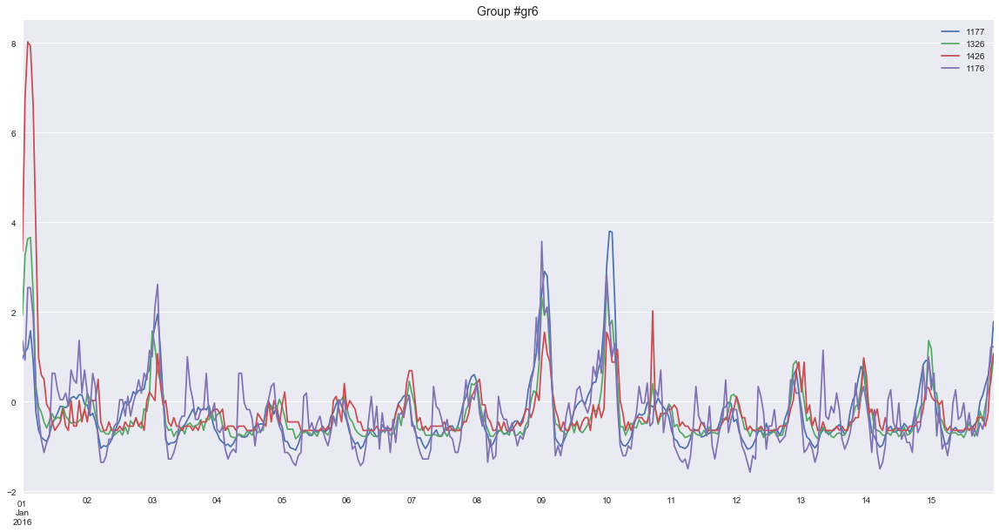

In [210]:
gr6 = {'gr6':['1177','1326','1426','1176']}
plotGroups(df2.loc['2016-01-01':'2016-01-15',ncl],gr6)

gr6 хорошая, добавляем в основной список

In [211]:
groups.update(gr6)

Смотрим на группу номер 14

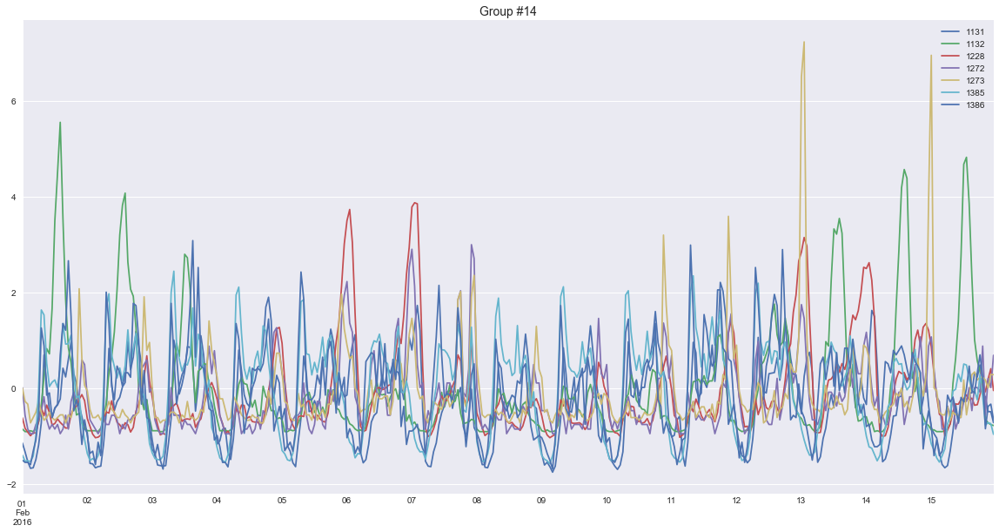

In [213]:
plotGroups(df2.loc['2016-02-01':'2016-02-15',ncl],{14: raw4.get(14)})

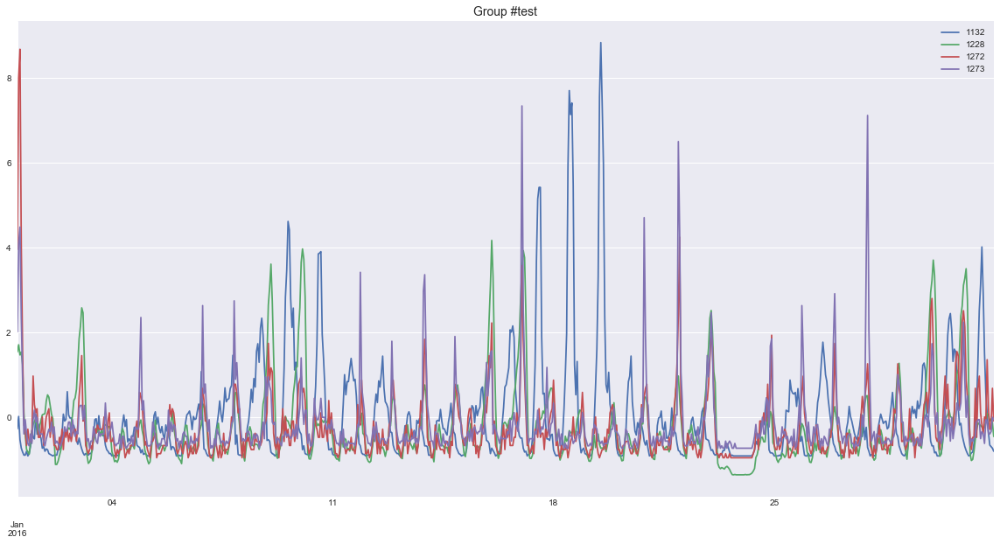

In [216]:
plotGroups(df2.loc['2016-01-01':'2016-01-31',ncl],{'test': ['1132','1228','1272','1273']})

Всё плохо, делаю кластеризацию ещё раз

In [24]:
ncl2 = getNonClusteredSeries(df2,groups)
raw5 = kMeansSeries(df2.loc['2016-01-01':'2016-03-1',ncl2])
#plotGroups(df2.loc['2016-01-01':'2016-01-15',ncl],raw5)    

NameError: name 'getNonClusteredSeries' is not defined

In [224]:
gr7 = {'gr7':['1388','1389']} 
groups.update(gr7)
groups.update({'gr8': raw5.get(17)})

In [25]:
ncl3 = getNonClusteredSeries(df2,groups)
raw6 = kMeansSeries(df2.loc['2016-01-01':'2016-03-1',ncl3],n_clusters = 12)
#plotGroups(df2.loc['2016-01-01':'2016-01-15',ncl],raw6)  

NameError: name 'getNonClusteredSeries' is not defined

In [227]:
# особых успехов нет, попробую кластеризацию агграгацией

In [26]:
raw7 = agglSeries(df2.loc['2016-01-01':'2016-03-1',ncl3], n_clusters = 20)

NameError: name 'agglSeries' is not defined

In [27]:
plotGroups(df2.loc['2016-01-01':'2016-01-15',ncl],raw7)  

NameError: name 'plotGroups' is not defined

In [237]:
groups.update({'gr9':['1530','1532']})

In [240]:
groups.update({'gr10':raw7[8]}) 

In [28]:
#Ещё один цикл кластеризации
ncl4 = getNonClusteredSeries(df2,groups)
raw8 = agglSeries(df2.loc['2016-01-01':'2016-03-1',ncl4], n_clusters = 10)
plotGroups(df2.loc['2016-01-01':'2016-01-15',ncl4],raw8)  

NameError: name 'getNonClusteredSeries' is not defined

In [285]:
groups.update({'gr11':['1075','1733','1734']})
groups.update({'gr12':['2069','2118']})

In [29]:
#Ещё один цикл кластеризации. Попробую уменьшить длину рядов.
ncl5 = getNonClusteredSeries(df2,groups)
raw9 = agglSeries(df2.loc['2016-01-01':'2016-01-31',ncl5], n_clusters = 10)
plotGroups(df2.loc['2016-01-01':'2016-01-15',:],raw9)  

NameError: name 'getNonClusteredSeries' is not defined

In [293]:
groups.update({'gr13':raw9[0]})

In [295]:
groups.update({'gr14':raw9[5]})

In [296]:
groups.update({'gr15':raw9[4]})

In [30]:
#Ещё один цикл кластеризации.
ncl6 = getNonClusteredSeries(df2,groups)
raw10 = agglSeries(df2.loc['2016-01-01':'2016-01-31',ncl6], n_clusters = 10)
plotGroups(df2.loc['2016-01-01':'2016-01-15',:],raw10)  

NameError: name 'getNonClusteredSeries' is not defined

In [300]:
groups.update({'gr16':raw10[6]})
groups.update({'gr17':raw10[7]})
groups.update({'gr18':raw10[8]})

In [4]:
#Ещё один цикл кластеризации.
ncl7 = getNonClusteredSeries(df2,groups)
raw11 = agglSeries(df2.loc['2016-01-01':'2016-01-31',ncl7], n_clusters = 10)
#plotGroups(df2.loc['2016-01-01':'2016-01-15',:],raw11)  

NameError: name 'getNonClusteredSeries' is not defined

In [303]:
groups.update({'gr19':raw11[5]})

In [3]:
#Ещё один цикл кластеризации.
#ncl8 = getNonClusteredSeries(df2,groups)
#raw12 = kMeansSeries(df2.loc['2016-01-01':'2016-01-31',ncl8], n_clusters = 9,random_state=np.random.randint(500))
#plotGroups(df2.loc['2016-02-01':'2016-02-20',:],raw12)  

Осталось несколько рядов, которые никак не хотят группировать во что-то приемлимое. Примем такую кластеризацию

In [315]:
groups.update({'gr20':raw12[4]})
groups.update({'gr21':raw12[5]})
groups.update({'gr22':raw12[6]})
groups.update({'gr23':raw12[7]})

Построим полученную классификацию

In [1]:
#plotGroups(df2.loc['2016-02-01':'2016-02-20',:],groups)  

In [318]:
# save groups to file
np.save('tsGroups.npy', groups) 

# Load
#read_dictionary = np.load('my_file.npy').item()
#print(read_dictionary['hello']) # displays "world"